This notebook is the continuation of the first training phase.

# Install dependencies

In [ ]:
!pip install -q transformers
!pip install -q SentencePiece

In [ ]:
import os
import json
import copy

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from PIL import Image
from sklearn.model_selection import train_test_split

In [ ]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim

from torch.utils.data import Dataset, DataLoader
from torch.utils.data.sampler import WeightedRandomSampler

from torchvision import transforms
from torchinfo import summary as model_summary

In [ ]:
from transformers import AutoModel, AutoTokenizer
from transformers import AutoImageProcessor

Set seed for reproducibility

In [ ]:
seed_value = 42

np.random.seed(seed_value)
torch.manual_seed(seed_value)

if torch.cuda.is_available():
    torch.cuda.manual_seed(seed_value)

torch.backends.cudnn.deterministic = True
torch.backends.cudnn.benchmark = False

# Load data

In [ ]:
class CustomDataset(Dataset):
    def __init__(self, dataframe, data_dir, transform=None):
        self.dataframe = dataframe
        self.data_dir = data_dir
        self.transform = transform

    def __len__(self):
        return len(self.dataframe)

    def __getitem__(self, idx):
        image_file = self.dataframe.iloc[idx]['image']
        image_path = os.path.join(self.data_dir, image_file)
        image = Image.open(image_path).convert('RGB')

        caption = self.dataframe.iloc[idx]['caption']
        label = self.dataframe.iloc[idx]['label_numeric']

        if self.transform:
            image = self.transform(image)

        return {
            'image': image,
            'caption': caption,
            'label': label,
        }

In [ ]:
train_dir = '/kaggle/input/dsc-train/Training/training-images/train-images'
train_annotation = '/kaggle/input/dsc-train/Training/vimmsd-train.json'

mapping = {
    'not-sarcasm': 0,
    'multi-sarcasm': 1,
    'image-sarcasm': 2,
    'text-sarcasm': 3
}

with open(train_annotation, 'r') as f:
    annotations = json.load(f)

df = pd.DataFrame.from_dict(annotations, orient='index')
df['label_numeric'] = df['label'].map(mapping)
df.head()

,image,caption,label,label_numeric
0,8ae451edcd8ebf697f8763ece249115813149c55733bf8...,Cô ấy trên mạng vs cô ấy ngoài đời =))),multi-sarcasm,1
1,35370ffd6c791d6f8c4ab3dd4363ed468fab41e4824ee9...,Người tâm linh giao tiếp với người thực tế :))),not-sarcasm,0
2,316fdd1477725b9fb1a55015ac06b68b92b50bd4303e08...,Hình như Trăng hôm nay đẹp quá mọi người ạ! 😃 ...,multi-sarcasm,1
3,8a0f34e0e30e4e5cfb306933c1d25fa801a5da78646b59...,MỌI NGƯỜI NGHĨ SAO VỀ PHÁT BIỂU CỦA SHARK VIỆT...,not-sarcasm,0
4,e517a5e95d1065886a7c815e82fe254381d4f9f4b244d4...,2 tay hai nàng chứ việc gì phải lệ hai hàng,multi-sarcasm,1


In [ ]:
train_df, val_df = train_test_split(df, test_size=0.2, random_state=42)
len(train_df), len(val_df)

(8644, 2161)

This time, we do **not** compute the label frequency from training data because the models are loaded with parameters trained in the first phase.

In [ ]:
transform = transforms.Compose([
    transforms.Resize((256, 256)),
    transforms.PILToTensor(),
])

val_dataset = CustomDataset(dataframe=val_df, data_dir=train_dir, transform=transform)
len(val_dataset)

2161

Increase batch size from 64 to 128 for the 2nd training phase

[Reference tweet](https://x.com/Yampeleg/status/1674034884652802048)

In [ ]:
batch_size = 128

val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False)

# Build model

This is the same architecture as the first training phase. We just copy the code and paste it here.

In [ ]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(device)

cuda


In [ ]:
class BaseTextEncoder(nn.Module):

    def __init__(self, model_name, tokenizer_class, model_class, max_len, trust_remote_code=False):
        super(BaseTextEncoder, self).__init__()

        self.max_len = max_len
        self.tokenizer = tokenizer_class.from_pretrained(model_name)
        self.text_transformer = model_class.from_pretrained(model_name, trust_remote_code=trust_remote_code)

    def forward(self, texts):
        texts = texts.tolist() if isinstance(texts, np.ndarray) else texts
        inputs = self.tokenizer(texts, padding='max_length', truncation=True, max_length=self.max_len, return_tensors='pt').to(device)
        outputs = self.text_transformer(**inputs)
        return outputs.last_hidden_state    # (B, N, D)


class ViSoBERT(BaseTextEncoder):
    def __init__(self, max_len=257):
        super(ViSoBERT, self).__init__(model_name='uitnlp/visobert', tokenizer_class=AutoTokenizer, model_class=AutoModel, max_len=max_len)

In [ ]:
class BaseImageEncoder(nn.Module):

    def __init__(self, model_name, tokenizer_class, model_class):
        super(BaseImageEncoder, self).__init__()
        self.processor = tokenizer_class.from_pretrained(model_name)
        self.vision_transformer = model_class.from_pretrained(model_name)

    def forward(self, images):
        images = images.to(device)
        inputs = self.processor(images=images, return_tensors="pt").to(device)
        outputs = self.vision_transformer(**inputs)
        return outputs.last_hidden_state    # (B, N, D)


class DINOv2_Base(BaseImageEncoder):
    def __init__(self):
        super(DINOv2_Base, self).__init__(model_name='facebook/dinov2-base', tokenizer_class=AutoImageProcessor, model_class=AutoModel)

In [ ]:
def clones(module, N):
    "Produce N identical layers."
    return nn.ModuleList([copy.deepcopy(module) for _ in range(N)])


class LayerNorm(nn.Module):
    def __init__(self, features, eps=1e-6):
        super(LayerNorm, self).__init__()
        self.a_2 = nn.Parameter(torch.ones(features))
        self.b_2 = nn.Parameter(torch.zeros(features))
        self.eps = eps

    def forward(self, x):
        mean = x.mean(-1, keepdim=True)
        std = x.std(-1, keepdim=True)
        return self.a_2 * (x - mean) / (std + self.eps) + self.b_2


class SublayerConnection(nn.Module):
    """
    A residual connection followed by a layer norm.
    Note for code simplicity the norm is first as opposed to last.
    """
    def __init__(self, d_model, dropout):
        super(SublayerConnection, self).__init__()
        self.norm = LayerNorm(d_model)
        self.dropout = nn.Dropout(dropout)

    def forward(self, x, sublayer):
        "Apply residual connection to any sublayer with the same size."
        return x + self.dropout(sublayer(self.norm(x)))

In [ ]:
class MultiHeadedAttention(nn.Module):
    def __init__(self, d_model, dropout=0.1):
        super(MultiHeadedAttention, self).__init__()

        self.d_model = d_model
        self.dropout = nn.Dropout(p=dropout)

        self.f_h = nn.Linear(self.d_model, self.d_model)
        self.w_h = nn.Parameter(torch.randn(self.d_model))
        self.f_o = nn.Linear(self.d_model, self.d_model)


    def forward(self, phi):

        h = self.f_h(phi)    # (B, N, D)
        scores = torch.matmul(h, self.w_h) / np.sqrt(self.d_model)  # (B, N)

        alphas = torch.softmax(scores, dim=-1)  # (B, N)
        alphas = alphas.unsqueeze(-1)           # (B, N, 1)

        if self.dropout is not None:
            alphas = self.dropout(alphas)

        c = torch.sum(alphas * h, dim=1, keepdim=True)    # (B, 1, D)
        v = c * h             # (B, N, D)
        o = h + self.f_o(v)   # (B, N, D)
        return o


class PositionwiseFeedForward(nn.Module):
    def __init__(self, d_model, d_ff, dropout=0.1):
        super(PositionwiseFeedForward, self).__init__()
        self.w_1 = nn.Linear(d_model, d_ff)
        self.w_2 = nn.Linear(d_ff, d_model)
        self.dropout = nn.Dropout(dropout)

    def forward(self, x):
        return self.w_2(self.dropout(self.w_1(x).relu()))

In [ ]:
class EncoderLayer(nn.Module):
    "Encoder is made up of self-attn and feed forward (defined below)"

    def __init__(self, d_model, self_attn, feed_forward, dropout):
        super(EncoderLayer, self).__init__()
        self.self_attn = self_attn
        self.feed_forward = feed_forward
        self.sublayer = clones(SublayerConnection(d_model, dropout), 2)    # 2 sub-layers: multi-head additive-attention & fully connected feed-forward
        self.d_model = d_model

    def forward(self, x):
        x = self.sublayer[0](x, self.self_attn)
        return self.sublayer[1](x, self.feed_forward)


class Encoder(nn.Module):
    "Core encoder is a stack of N layers"

    def __init__(self, layer, N, C=4, dropout_rate=0.5):
        super(Encoder, self).__init__()
        self.image_encoder = DINOv2_Base()
        self.text_encoder = ViSoBERT()

        self.layers = clones(layer, N)  # Composition blocks
        self.norm = LayerNorm(layer.d_model)

        self.classifier = nn.Sequential(
            nn.Linear(layer.d_model, 128),
            nn.ReLU(),
            nn.Dropout(dropout_rate),
            nn.Linear(128, C)
        )

    def freeze_encoders(self):
        for param in self.image_encoder.parameters():
            param.requires_grad = False
        for param in self.text_encoder.parameters():
            param.requires_grad = False

    def forward(self, images, captions):
        phi_x = self.image_encoder(images)
        phi_t = self.text_encoder(captions)

        phi_xt = torch.cat((phi_x, phi_t), axis=1)
        o_xt = phi_xt

        for layer in self.layers:
            o_xt = layer(o_xt)

        o_xt = self.norm(o_xt)
        x = self.classifier(o_xt.mean(dim=1))
        return x

This is also the same setting as the 1st training phase.

In [ ]:
N = 1
d_model = 768
d_ff = 3072
dropout = 0.1

c = copy.deepcopy
attn = MultiHeadedAttention(d_model, dropout)
ff = PositionwiseFeedForward(d_model, d_ff, dropout)

# Training

We also prepare training data using bootstrapping. The only difference is that the batch size increases from 64 to 128.

In [ ]:
def create_bootstrap_loader(df, batch_size):

    random_state = np.random.randint(0, 10000)
    print('\nrandom_state: ', random_state)

    bootstrapped_df = df.sample(n=len(df), replace=True, random_state=random_state)
    print(bootstrapped_df['label_numeric'].value_counts())

    class_counts = bootstrapped_df['label_numeric'].value_counts().sort_index().values
    sample_weights = 1. / class_counts
    bootstrapped_df['weight'] = bootstrapped_df['label_numeric'].map(lambda label: sample_weights[label])

    sampler = WeightedRandomSampler(
        weights = bootstrapped_df['weight'].values,
        num_samples = len(bootstrapped_df['weight']),
        replacement = True
    )

    subset = CustomDataset(dataframe=bootstrapped_df, data_dir=train_dir, transform=transform)
    loader = DataLoader(subset, batch_size=batch_size, sampler=sampler)
    return loader

**Note: we load models with parameters from the 1st phase, then continue training.**

In [ ]:
num_models = 12

models = []
optimizers = []
train_loaders = []

for idx in range(num_models):

    bootstrapped_loader = create_bootstrap_loader(train_df, batch_size)

    model = Encoder(EncoderLayer(d_model, c(attn), c(ff), dropout), N).to(device)
    model.freeze_encoders()

    model.load_state_dict(torch.load(f'/kaggle/input/12models_2inputs_correct_submit10/pytorch/default/1/model_{idx+1}_best.pth'))

    optimizer = torch.optim.SGD(filter(lambda p: p.requires_grad, model.parameters()),
                                lr=0.004, momentum=0.9, weight_decay=5e-4)


    models.append(model)
    optimizers.append(optimizer)
    train_loaders.append(bootstrapped_loader)


best_val_losses = [float('inf')] * num_models
best_val_accs = [0.0] * num_models


random_state:  7270
label_numeric
0    4819
1    3388
2     375
3      62
Name: count, dtype: int64


preprocessor_config.json:   0%|          | 0.00/436 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/548 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/346M [00:00<?, ?B/s]

config.json:   0%|          | 0.00/644 [00:00<?, ?B/s]

sentencepiece.bpe.model:   0%|          | 0.00/471k [00:00<?, ?B/s]

/opt/conda/lib/python3.10/site-packages/transformers/tokenization_utils_base.py:1617: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be deprecated in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(


pytorch_model.bin:   0%|          | 0.00/390M [00:00<?, ?B/s]

Some weights of XLMRobertaModel were not initialized from the model checkpoint at uitnlp/visobert and are newly initialized: ['roberta.pooler.dense.bias', 'roberta.pooler.dense.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
/tmp/ipykernel_30/4142100731.py:14: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We


random_state:  860
label_numeric
0    4826
1    3398
2     350
3      70
Name: count, dtype: int64


/opt/conda/lib/python3.10/site-packages/transformers/tokenization_utils_base.py:1617: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be deprecated in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
Some weights of XLMRobertaModel were not initialized from the model checkpoint at uitnlp/visobert and are newly initialized: ['roberta.pooler.dense.bias', 'roberta.pooler.dense.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
/tmp/ipykernel_30/4142100731.py:14: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pyto


random_state:  5390
label_numeric
0    4877
1    3359
2     350
3      58
Name: count, dtype: int64


/opt/conda/lib/python3.10/site-packages/transformers/tokenization_utils_base.py:1617: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be deprecated in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
Some weights of XLMRobertaModel were not initialized from the model checkpoint at uitnlp/visobert and are newly initialized: ['roberta.pooler.dense.bias', 'roberta.pooler.dense.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
/tmp/ipykernel_30/4142100731.py:14: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pyto


random_state:  5191
label_numeric
0    4939
1    3289
2     368
3      48
Name: count, dtype: int64


/opt/conda/lib/python3.10/site-packages/transformers/tokenization_utils_base.py:1617: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be deprecated in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
Some weights of XLMRobertaModel were not initialized from the model checkpoint at uitnlp/visobert and are newly initialized: ['roberta.pooler.dense.bias', 'roberta.pooler.dense.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
/tmp/ipykernel_30/4142100731.py:14: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pyto


random_state:  5734
label_numeric
0    4854
1    3362
2     374
3      54
Name: count, dtype: int64


/opt/conda/lib/python3.10/site-packages/transformers/tokenization_utils_base.py:1617: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be deprecated in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
Some weights of XLMRobertaModel were not initialized from the model checkpoint at uitnlp/visobert and are newly initialized: ['roberta.pooler.dense.bias', 'roberta.pooler.dense.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
/tmp/ipykernel_30/4142100731.py:14: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pyto


random_state:  6265
label_numeric
0    4783
1    3450
2     356
3      55
Name: count, dtype: int64


/opt/conda/lib/python3.10/site-packages/transformers/tokenization_utils_base.py:1617: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be deprecated in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
Some weights of XLMRobertaModel were not initialized from the model checkpoint at uitnlp/visobert and are newly initialized: ['roberta.pooler.dense.bias', 'roberta.pooler.dense.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
/tmp/ipykernel_30/4142100731.py:14: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pyto


random_state:  466
label_numeric
0    4886
1    3321
2     372
3      65
Name: count, dtype: int64


/opt/conda/lib/python3.10/site-packages/transformers/tokenization_utils_base.py:1617: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be deprecated in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
Some weights of XLMRobertaModel were not initialized from the model checkpoint at uitnlp/visobert and are newly initialized: ['roberta.pooler.dense.bias', 'roberta.pooler.dense.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
/tmp/ipykernel_30/4142100731.py:14: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pyto


random_state:  4426
label_numeric
0    4838
1    3401
2     351
3      54
Name: count, dtype: int64


/opt/conda/lib/python3.10/site-packages/transformers/tokenization_utils_base.py:1617: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be deprecated in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
Some weights of XLMRobertaModel were not initialized from the model checkpoint at uitnlp/visobert and are newly initialized: ['roberta.pooler.dense.bias', 'roberta.pooler.dense.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
/tmp/ipykernel_30/4142100731.py:14: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pyto


random_state:  5578
label_numeric
0    4941
1    3326
2     332
3      45
Name: count, dtype: int64


/opt/conda/lib/python3.10/site-packages/transformers/tokenization_utils_base.py:1617: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be deprecated in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
Some weights of XLMRobertaModel were not initialized from the model checkpoint at uitnlp/visobert and are newly initialized: ['roberta.pooler.dense.bias', 'roberta.pooler.dense.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
/tmp/ipykernel_30/4142100731.py:14: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pyto


random_state:  8322
label_numeric
0    4744
1    3511
2     334
3      55
Name: count, dtype: int64


/opt/conda/lib/python3.10/site-packages/transformers/tokenization_utils_base.py:1617: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be deprecated in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
Some weights of XLMRobertaModel were not initialized from the model checkpoint at uitnlp/visobert and are newly initialized: ['roberta.pooler.dense.bias', 'roberta.pooler.dense.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
/tmp/ipykernel_30/4142100731.py:14: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pyto


random_state:  1685
label_numeric
0    4878
1    3366
2     337
3      63
Name: count, dtype: int64


/opt/conda/lib/python3.10/site-packages/transformers/tokenization_utils_base.py:1617: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be deprecated in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
Some weights of XLMRobertaModel were not initialized from the model checkpoint at uitnlp/visobert and are newly initialized: ['roberta.pooler.dense.bias', 'roberta.pooler.dense.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
/tmp/ipykernel_30/4142100731.py:14: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pyto


random_state:  769
label_numeric
0    4879
1    3377
2     340
3      48
Name: count, dtype: int64


/opt/conda/lib/python3.10/site-packages/transformers/tokenization_utils_base.py:1617: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be deprecated in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
Some weights of XLMRobertaModel were not initialized from the model checkpoint at uitnlp/visobert and are newly initialized: ['roberta.pooler.dense.bias', 'roberta.pooler.dense.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
/tmp/ipykernel_30/4142100731.py:14: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pyto

In [ ]:
model_summary(models[-1])

Layer (type:depth-idx)                                                 Param #
Encoder                                                                --
├─DINOv2_Base: 1-1                                                     --
│    └─Dinov2Model: 2-1                                                --
│    │    └─Dinov2Embeddings: 3-1                                      (1,506,048)
│    │    └─Dinov2Encoder: 3-2                                         (85,072,896)
│    │    └─LayerNorm: 3-3                                             (1,536)
├─ViSoBERT: 1-2                                                        --
│    └─XLMRobertaModel: 2-2                                            --
│    │    └─XLMRobertaEmbeddings: 3-4                                  (11,920,896)
│    │    └─XLMRobertaEncoder: 3-5                                     (85,054,464)
│    │    └─XLMRobertaPooler: 3-6                                      (590,592)
├─ModuleList: 1-3                                       

In [ ]:
criterion = nn.CrossEntropyLoss().to(device)


Evaluate the models' performance after the 1st training phase.

There is minor a difference in the loss because we have increased the batch size from 64 to 128.

In [ ]:
for idx, model in enumerate(models):
    model.eval()

    val_loss = 0.0
    val_correct = 0
    val_total = 0

    with torch.no_grad():
        for batch in val_loader:

            images = batch['image']
            captions = batch['caption']
            targets = batch['label'].to(device)

            logits = model(images, captions)
            loss = criterion(logits, targets)
            val_loss += loss.item()

            preds = logits.argmax(dim=1)
            val_correct += (preds == targets).sum().item()
            val_total += targets.size(0)

    val_loss /= len(val_loader)
    val_acc = val_correct / val_total

    best_val_losses[idx] = val_loss
    best_val_accs[idx] = val_acc

    print(f'\nBest model {idx+1} - Validation Loss: {val_loss:.5f}, Validation Accuracy: {val_acc:.5f}')


Best model 1 - Validation Loss: 0.81244, Validation Accuracy: 0.65895

Best model 2 - Validation Loss: 0.90415, Validation Accuracy: 0.62749

Best model 3 - Validation Loss: 0.87275, Validation Accuracy: 0.63906

Best model 4 - Validation Loss: 0.87449, Validation Accuracy: 0.64692

Best model 5 - Validation Loss: 0.85557, Validation Accuracy: 0.65155

Best model 6 - Validation Loss: 0.87754, Validation Accuracy: 0.66312

Best model 7 - Validation Loss: 0.88188, Validation Accuracy: 0.61777

Best model 8 - Validation Loss: 0.85554, Validation Accuracy: 0.63767

Best model 9 - Validation Loss: 0.83480, Validation Accuracy: 0.63350

Best model 10 - Validation Loss: 0.84761, Validation Accuracy: 0.65062

Best model 11 - Validation Loss: 0.82762, Validation Accuracy: 0.64785

Best model 12 - Validation Loss: 0.84808, Validation Accuracy: 0.64137


Update the best loss & accuracy

In [ ]:
for idx in range(num_models):

    print(f'\nBest model {idx+1} - Validation Loss: {best_val_losses[idx]:.5f}, Validation Accuracy: {best_val_accs[idx]:.5f}')


Best model 1 - Validation Loss: 0.81244, Validation Accuracy: 0.65895

Best model 2 - Validation Loss: 0.90415, Validation Accuracy: 0.62749

Best model 3 - Validation Loss: 0.87275, Validation Accuracy: 0.63906

Best model 4 - Validation Loss: 0.87449, Validation Accuracy: 0.64692

Best model 5 - Validation Loss: 0.85557, Validation Accuracy: 0.65155

Best model 6 - Validation Loss: 0.87754, Validation Accuracy: 0.66312

Best model 7 - Validation Loss: 0.88188, Validation Accuracy: 0.61777

Best model 8 - Validation Loss: 0.85554, Validation Accuracy: 0.63767

Best model 9 - Validation Loss: 0.83480, Validation Accuracy: 0.63350

Best model 10 - Validation Loss: 0.84761, Validation Accuracy: 0.65062

Best model 11 - Validation Loss: 0.82762, Validation Accuracy: 0.64785

Best model 12 - Validation Loss: 0.84808, Validation Accuracy: 0.64137


Start training

In [ ]:
num_epochs = 7
criterion = nn.CrossEntropyLoss().to(device)

for epoch in range(num_epochs):
    print(f'\n\nEpoch {epoch + 1}/{num_epochs}')

    for i, (model, optimizer, train_loader) in enumerate(zip(models, optimizers, train_loaders)):

        model.train()
        train_loss = 0.0
        train_correct, train_total = 0, 0

        for batch in train_loader:

            images = batch['image']
            captions = batch['caption']
            targets = batch['label'].to(device)

            optimizer.zero_grad()

            logits = model(images, captions)
            loss = criterion(logits, targets)
            train_loss += loss.item()

            preds = logits.argmax(dim=1)
            train_correct += (preds == targets).sum().item()
            train_total += targets.size(0)

            loss.backward()
            optimizer.step()

        train_loss /= len(train_loader)
        train_acc = train_correct / train_total


        model.eval()
        val_loss = 0.0
        val_correct, val_total = 0, 0

        with torch.no_grad():

            for batch in val_loader:

                images = batch['image']
                captions = batch['caption']
                targets = batch['label'].to(device)

                logits = model(images, captions)
                loss = criterion(logits, targets)
                val_loss += loss.item()

                preds = logits.argmax(dim=1)
                val_correct += (preds == targets).sum().item()
                val_total += targets.size(0)

        val_loss /= len(val_loader)
        val_acc = val_correct / val_total


        if val_loss <= best_val_losses[i] and val_acc >= best_val_accs[i]:
            best_val_losses[i] = val_loss
            best_val_accs[i] = val_acc

            torch.save(model.state_dict(), f'model_{i+1}_best.pth')
            print(f'\n\tModel {i+1} \t Train Loss: {train_loss:.5f} \t Train Acc: {train_acc:.5f} \t Val Loss: {val_loss:.5f} \t Val Acc: {val_acc:.5f} \t (Updated)')

        else:
            print(f'\n\tModel {i+1} \t Train Loss: {train_loss:.5f} \t Train Acc: {train_acc:.5f} \t Val Loss: {val_loss:.5f} \t Val Acc: {val_acc:.5f}')



Epoch 1/7

	Model 1 	 Train Loss: 0.37555 	 Train Acc: 0.85180 	 Val Loss: 0.87638 	 Val Acc: 0.64183

	Model 2 	 Train Loss: 0.35672 	 Train Acc: 0.85412 	 Val Loss: 0.93578 	 Val Acc: 0.61453

	Model 3 	 Train Loss: 0.32084 	 Train Acc: 0.87031 	 Val Loss: 0.86612 	 Val Acc: 0.64646 	 (Updated)

	Model 4 	 Train Loss: 0.27359 	 Train Acc: 0.88547 	 Val Loss: 0.94094 	 Val Acc: 0.63952

	Model 5 	 Train Loss: 0.31723 	 Train Acc: 0.87506 	 Val Loss: 0.90097 	 Val Acc: 0.64415

	Model 6 	 Train Loss: 0.23793 	 Train Acc: 0.89901 	 Val Loss: 0.94264 	 Val Acc: 0.65849

	Model 7 	 Train Loss: 0.44632 	 Train Acc: 0.82670 	 Val Loss: 0.91529 	 Val Acc: 0.60296

	Model 8 	 Train Loss: 0.37196 	 Train Acc: 0.85042 	 Val Loss: 0.88378 	 Val Acc: 0.62980

	Model 9 	 Train Loss: 0.44937 	 Train Acc: 0.81976 	 Val Loss: 0.90314 	 Val Acc: 0.61916

	Model 10 	 Train Loss: 0.29690 	 Train Acc: 0.88061 	 Val Loss: 0.90362 	 Val Acc: 0.63952

	Model 11 	 Train Loss: 0.38222 	 Train Acc: 0.84729 	

**Indeed! Continue training with larger batch size helps some models gain better performance on the evaluation dataset**

Train takes 7 hours 25 mins

# Evaluation

Load best models

In [ ]:
os.listdir()

['model_3_best.pth',
 '.virtual_documents',
 'model_7_best.pth',
 'model_12_best.pth']

In [ ]:
os.getcwd()

'/kaggle/working'

In [ ]:
os.chdir(r'/kaggle')
os.listdir()

['lib', 'input', 'working']

In [ ]:
for idx, model in enumerate(models):

    output_model_path = f'/kaggle/working/model_{idx+1}_best.pth'
    input_model_path = f'/kaggle/input/12models_2inputs_correct_submit10/pytorch/default/1/model_{idx+1}_best.pth'

    if os.path.exists(output_model_path):
        model.load_state_dict(torch.load(output_model_path))
        model.eval()
        print(f'Load model {idx+1} from output directory')
    else:
        model.load_state_dict(torch.load(input_model_path))
        model.eval()
        print(f'Load model {idx+1} from input directory')

/tmp/ipykernel_30/958245167.py:11: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(input_model_path))


Load model 1 from input directory
Load model 2 from input directory


/tmp/ipykernel_30/958245167.py:7: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(output_model_path))


Load model 3 from output directory
Load model 4 from input directory
Load model 5 from input directory
Load model 6 from input directory
Load model 7 from output directory
Load model 8 from input directory
Load model 9 from input directory
Load model 10 from input directory
Load model 11 from input directory
Load model 12 from output directory


Evaluate the performance of each model separately

In [ ]:
for idx, model in enumerate(models):
    model.eval()

    val_loss = 0.0
    val_correct = 0
    val_total = 0

    with torch.no_grad():
        for batch in val_loader:

            images = batch['image']
            captions = batch['caption']
            targets = batch['label'].to(device)

            logits = model(images, captions)
            loss = criterion(logits, targets)
            val_loss += loss.item()

            preds = logits.argmax(dim=1)
            val_correct += (preds == targets).sum().item()
            val_total += targets.size(0)

    val_loss /= len(val_loader)
    val_acc = val_correct / val_total

    print(f'\nBest model {idx+1} - Validation Loss: {val_loss:.5f}, Validation Accuracy: {val_acc:.5f}')


Best model 1 - Validation Loss: 0.81244, Validation Accuracy: 0.65895

Best model 2 - Validation Loss: 0.90415, Validation Accuracy: 0.62749

Best model 3 - Validation Loss: 0.86612, Validation Accuracy: 0.64646

Best model 4 - Validation Loss: 0.87449, Validation Accuracy: 0.64692

Best model 5 - Validation Loss: 0.85557, Validation Accuracy: 0.65155

Best model 6 - Validation Loss: 0.87754, Validation Accuracy: 0.66312

Best model 7 - Validation Loss: 0.85219, Validation Accuracy: 0.64646

Best model 8 - Validation Loss: 0.85554, Validation Accuracy: 0.63767

Best model 9 - Validation Loss: 0.83480, Validation Accuracy: 0.63350

Best model 10 - Validation Loss: 0.84761, Validation Accuracy: 0.65062

Best model 11 - Validation Loss: 0.82762, Validation Accuracy: 0.64785

Best model 12 - Validation Loss: 0.84353, Validation Accuracy: 0.65757


Evaluate the performance of the ensemble

In [ ]:
val_loss = 0.0
val_correct = 0
val_total = 0

all_preds = []
all_targets = []

with torch.no_grad():

    for batch in val_loader:

        images = batch['image']
        captions = batch['caption']
        targets = batch['label'].to(device)

        logits = [model(images, captions) for model in models]
        logits = torch.stack(logits)  # (num_models, batch_size, num_classes)

        ensemble_logits = logits.mean(dim=0)  # Average logits
        loss = criterion(ensemble_logits, targets)
        val_loss += loss.item()

        preds = ensemble_logits.argmax(dim=1)  # Final predictions
        val_correct += (preds == targets).sum().item()
        val_total += targets.size(0)

        all_preds.extend(preds.cpu().numpy())
        all_targets.extend(targets.cpu().numpy())

val_loss /= len(val_loader)
val_acc = val_correct / val_total

print(f'Ensemble models - Validation Loss: {val_loss:.5f}, Validation Accuracy: {val_acc:.5f}')

Ensemble models - Validation Loss: 0.74799, Validation Accuracy: 0.67099


In [ ]:
best_ensemble_loss = val_loss
best_ensemble_acc = val_acc
print(f'Ensemble models - Validation Loss: {best_ensemble_loss:.5f}, Validation Accuracy: {best_ensemble_acc:.5f}')

Ensemble models - Validation Loss: 0.74799, Validation Accuracy: 0.67099


In [ ]:
from sklearn.metrics import accuracy_score, classification_report

accuracy = accuracy_score(all_targets, all_preds)
print(f"Accuracy: {accuracy:.5f}")

print("\nClassification Report:")
print(classification_report(all_targets, all_preds))

Accuracy: 0.67099

Classification Report:
              precision    recall  f1-score   support

           0       0.79      0.65      0.71      1210
           1       0.59      0.76      0.66       846
           2       0.37      0.27      0.32        84
           3       0.17      0.05      0.07        21

    accuracy                           0.67      2161
   macro avg       0.48      0.43      0.44      2161
weighted avg       0.69      0.67      0.67      2161



In [ ]:
from sklearn.metrics import f1_score

f1_micro = f1_score(all_targets, all_preds, average='micro')
f1_macro = f1_score(all_targets, all_preds, average='macro')
f1_weighted = f1_score(all_targets, all_preds, average='weighted')

print(f'\n F1 Score (Micro): {f1_micro:.5f} \n\n F1 Score (Macro): {f1_macro:.5f} \n\n F1 Score (Weighted): {f1_weighted:.5f}')


 F1 Score (Micro): 0.67099 

 F1 Score (Macro): 0.44014 

 F1 Score (Weighted): 0.66973


# Pruning

**Prune some base models with bad performance**

In [ ]:
selected_model_indices = list(range(len(models)))
selected_model_indices

[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11]

In [ ]:
# Loop through models and evaluate ensemble with one model removed
for i in range(len(models)):
    print(f'\n {selected_model_indices=}')

    temp_val_loss = 0.0
    temp_val_correct = 0
    temp_val_total = 0

    with torch.no_grad():
        for batch in val_loader:

            images = batch['image']
            captions = batch['caption']
            targets = batch['label'].to(device)

            # Compute logits excluding model[i]
            logits = [
                model(images, captions)
                for j, model in enumerate(models)
                if j != i and j in selected_model_indices
            ]
            logits = torch.stack(logits)

            # Average logits across the remaining models
            ensemble_logits = logits.mean(dim=0)
            loss = criterion(ensemble_logits, targets)
            temp_val_loss += loss.item()

            preds = ensemble_logits.argmax(dim=1)
            temp_val_correct += (preds == targets).sum().item()
            temp_val_total += targets.size(0)

    temp_val_loss /= len(val_loader)
    temp_val_acc = temp_val_correct / temp_val_total
    print(f'\n Ensemble without Model {i+1} - Validation Loss: {temp_val_loss:.5f}, Validation Accuracy: {temp_val_acc:.5f}')

    if temp_val_loss < best_ensemble_loss and temp_val_acc > best_ensemble_acc:
        selected_model_indices.remove(i)
        best_ensemble_loss = temp_val_loss
        best_ensemble_acc = temp_val_acc
        print(f'\n Remove Model {i+1} from Ensemble')


 selected_model_indices=[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11]

 Ensemble without Model 1 - Validation Loss: 0.75022, Validation Accuracy: 0.67145

 selected_model_indices=[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11]

 Ensemble without Model 2 - Validation Loss: 0.74524, Validation Accuracy: 0.66775

 selected_model_indices=[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11]

 Ensemble without Model 3 - Validation Loss: 0.74880, Validation Accuracy: 0.66913

 selected_model_indices=[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11]

 Ensemble without Model 4 - Validation Loss: 0.74812, Validation Accuracy: 0.67006

 selected_model_indices=[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11]

 Ensemble without Model 5 - Validation Loss: 0.74687, Validation Accuracy: 0.66867

 selected_model_indices=[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11]

 Ensemble without Model 6 - Validation Loss: 0.75227, Validation Accuracy: 0.66728

 selected_model_indices=[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11]

 Ensemble without Model 7 - Validation Loss: 0.

Compute ensemble once again with the best models selected

In [ ]:
selected_model_indices

[0, 1, 2, 3, 4, 5, 6, 8, 10, 11]

In [ ]:
val_loss = 0.0
val_correct = 0
val_total = 0

all_preds = []
all_targets = []

with torch.no_grad():

    for batch in val_loader:

        images = batch['image']
        captions = batch['caption']
        targets = batch['label'].to(device)

        logits = [models[i](images, captions) for i in selected_model_indices]
        logits = torch.stack(logits)  # (num_models, batch_size, num_classes)

        ensemble_logits = logits.mean(dim=0)  # Average logits
        loss = criterion(ensemble_logits, targets)
        val_loss += loss.item()

        preds = ensemble_logits.argmax(dim=1)  # Final predictions
        val_correct += (preds == targets).sum().item()
        val_total += targets.size(0)

        all_preds.extend(preds.cpu().numpy())
        all_targets.extend(targets.cpu().numpy())

val_loss /= len(val_loader)
val_acc = val_correct / val_total

print(f'Using models {selected_model_indices} - Validation Loss: {val_loss:.5f}, Validation Accuracy: {val_acc:.5f}')

Using models [0, 1, 2, 3, 4, 5, 6, 8, 10, 11] - Validation Loss: 0.74716, Validation Accuracy: 0.67515


In [ ]:
from sklearn.metrics import accuracy_score, classification_report

accuracy = accuracy_score(all_targets, all_preds)
print(f"Accuracy: {accuracy:.5f}")

print("\nClassification Report:")
print(classification_report(all_targets, all_preds))

Accuracy: 0.67515

Classification Report:
              precision    recall  f1-score   support

           0       0.79      0.66      0.72      1210
           1       0.59      0.76      0.66       846
           2       0.38      0.27      0.32        84
           3       0.14      0.05      0.07        21

    accuracy                           0.68      2161
   macro avg       0.48      0.43      0.44      2161
weighted avg       0.69      0.68      0.67      2161



In [ ]:
from sklearn.metrics import f1_score

f1_micro = f1_score(all_targets, all_preds, average='micro')
f1_macro = f1_score(all_targets, all_preds, average='macro')
f1_weighted = f1_score(all_targets, all_preds, average='weighted')

print(f'\n F1 Score (Micro): {f1_micro:.5f} \n\n F1 Score (Macro): {f1_macro:.5f} \n\n F1 Score (Weighted): {f1_weighted:.5f}')


 F1 Score (Micro): 0.67515 

 F1 Score (Macro): 0.44256 

 F1 Score (Weighted): 0.67396


# Inference

Load the private test

In [ ]:
test_dir = '/kaggle/input/dsc-private-test/PrivateTest/private-test-images/test-images'
test_annotation = '/kaggle/input/dsc-private-test/PrivateTest/vimmsd-private-test.json'

with open(test_annotation, 'r') as f:
    annotations = json.load(f)

test_df = pd.DataFrame.from_dict(annotations, orient='index')
test_df.head()

,image,caption,label
0,066d6021fdfeaf39f1dec523879e8fe4d35e877abcea44...,Song Joong Ki &amp; Song Hye Kyo đều tham dự B...,None
1,555f4787d4df49e7be743b3d5b77c90755f0d6c351f36b...,Song Joong Ki &amp; Song Hye Kyo đều tham dự B...,None
2,7b7cdea2cde1f3f93371259b587a03f2e8c0af682b4d51...,Song Joong Ki &amp; Song Hye Kyo đều tham dự B...,None
3,80167e59d729cf3aaba5d2d3da40db6995cb8a6a8c4a88...,Song Joong Ki &amp; Song Hye Kyo đều tham dự B...,None
4,59db087307031d60755af3a5c01a44ba55a04bfab21027...,Ngang trái thậc 🤣,None


In [ ]:
class TestDataset(Dataset):
    def __init__(self, dataframe, data_dir, transform=None):
        self.dataframe = dataframe
        self.data_dir = data_dir
        self.transform = transform

    def __len__(self):
        return len(self.dataframe)

    def __getitem__(self, idx):

        image_file = self.dataframe.iloc[idx]['image']
        image_path = os.path.join(self.data_dir, image_file)
        image = Image.open(image_path).convert('RGB')

        caption = self.dataframe.iloc[idx]['caption']
        label = self.dataframe.iloc[idx]['label']

        if self.transform:
            image = self.transform(image)

        return {
            'idx': idx,
            'image': image,
            'caption': caption,
        }

test_dataset = TestDataset(dataframe=test_df, data_dir=test_dir, transform=transform)
len(test_dataset)

1504


 tensor(0)


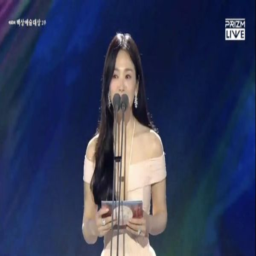

Song Joong Ki &amp; Song Hye Kyo đều tham dự Baeksang 2024 với 2 vai trò khác nhau và không chung khung hình. Nữ chính The Glory không đi thảm đỏ mà chỉ xuất hiện trên sân khấu để đọc đề cử Nữ chính xuất sắc (phim truyền hình). 
Trước đó, thông tin 2 người sẽ dự lễ trao giải này được khán giả Trung quan tâm, từ khoá đứng thứ 2 hotsearch với 70 triệu lượt xem trên Weibo.

 tensor(1)


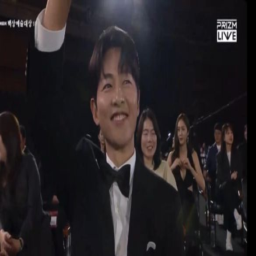

Song Joong Ki &amp; Song Hye Kyo đều tham dự Baeksang 2024 với 2 vai trò khác nhau và không chung khung hình. Nữ chính The Glory không đi thảm đỏ mà chỉ xuất hiện trên sân khấu để đọc đề cử Nữ chính xuất sắc (phim truyền hình). 
Trước đó, thông tin 2 người sẽ dự lễ trao giải này được khán giả Trung quan tâm, từ khoá đứng thứ 2 hotsearch với 70 triệu lượt xem trên Weibo.

 tensor(2)


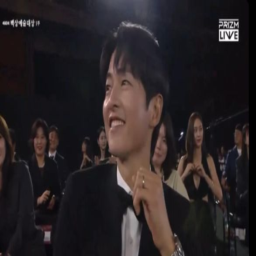

Song Joong Ki &amp; Song Hye Kyo đều tham dự Baeksang 2024 với 2 vai trò khác nhau và không chung khung hình. Nữ chính The Glory không đi thảm đỏ mà chỉ xuất hiện trên sân khấu để đọc đề cử Nữ chính xuất sắc (phim truyền hình). 
Trước đó, thông tin 2 người sẽ dự lễ trao giải này được khán giả Trung quan tâm, từ khoá đứng thứ 2 hotsearch với 70 triệu lượt xem trên Weibo.

 tensor(3)


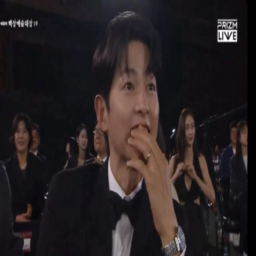

Song Joong Ki &amp; Song Hye Kyo đều tham dự Baeksang 2024 với 2 vai trò khác nhau và không chung khung hình. Nữ chính The Glory không đi thảm đỏ mà chỉ xuất hiện trên sân khấu để đọc đề cử Nữ chính xuất sắc (phim truyền hình). 
Trước đó, thông tin 2 người sẽ dự lễ trao giải này được khán giả Trung quan tâm, từ khoá đứng thứ 2 hotsearch với 70 triệu lượt xem trên Weibo.

 tensor(4)


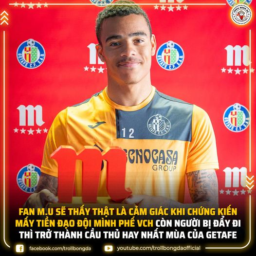

Ngang trái thậc 🤣

 tensor(5)


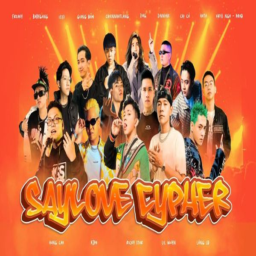

SAU ĐEN VÂU - DOUBLE 2T, DÀN RAPPER ĐÌNH ĐÁM VIỆT NAM CHUNG TAY LÀM 1 BẢN NHẠC GÓP GẠCH XÂY LỚP CHO CÁC EM
14 anh em rapper trên khắp mọi miền đất nước quy tụ lại với nhau trong 1 cypher, dùng nhạc rap để lan tỏa yêu thương, tất cả vì một mục đích chung là mang lớp học đến với những em nhỏ vùng cao.
Shout out cho MC ILL, Ricky Star, Lil Wuyn, Pjpo, LĂNG LD, Chiennhatlang, Giang Đẫm, Freaky , BabyGang, Chị Cả, Ultimít , Ziog, Zinnine, Hata
SayLove - Xây Lớp Vùng Cao

 tensor(6)


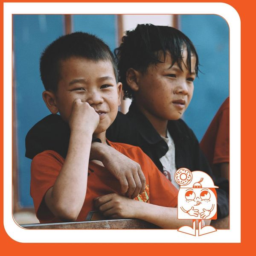

SAU ĐEN VÂU - DOUBLE 2T, DÀN RAPPER ĐÌNH ĐÁM VIỆT NAM CHUNG TAY LÀM 1 BẢN NHẠC GÓP GẠCH XÂY LỚP CHO CÁC EM
14 anh em rapper trên khắp mọi miền đất nước quy tụ lại với nhau trong 1 cypher, dùng nhạc rap để lan tỏa yêu thương, tất cả vì một mục đích chung là mang lớp học đến với những em nhỏ vùng cao.
Shout out cho MC ILL, Ricky Star, Lil Wuyn, Pjpo, LĂNG LD, Chiennhatlang, Giang Đẫm, Freaky , BabyGang, Chị Cả, Ultimít , Ziog, Zinnine, Hata
SayLove - Xây Lớp Vùng Cao

 tensor(7)


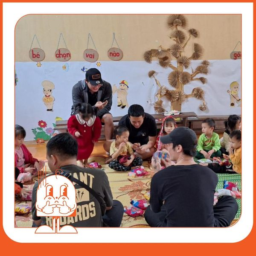

SAU ĐEN VÂU - DOUBLE 2T, DÀN RAPPER ĐÌNH ĐÁM VIỆT NAM CHUNG TAY LÀM 1 BẢN NHẠC GÓP GẠCH XÂY LỚP CHO CÁC EM
14 anh em rapper trên khắp mọi miền đất nước quy tụ lại với nhau trong 1 cypher, dùng nhạc rap để lan tỏa yêu thương, tất cả vì một mục đích chung là mang lớp học đến với những em nhỏ vùng cao.
Shout out cho MC ILL, Ricky Star, Lil Wuyn, Pjpo, LĂNG LD, Chiennhatlang, Giang Đẫm, Freaky , BabyGang, Chị Cả, Ultimít , Ziog, Zinnine, Hata
SayLove - Xây Lớp Vùng Cao

 tensor(8)


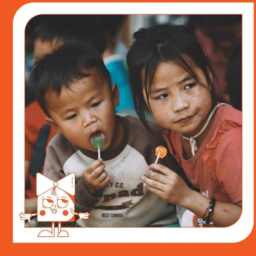

SAU ĐEN VÂU - DOUBLE 2T, DÀN RAPPER ĐÌNH ĐÁM VIỆT NAM CHUNG TAY LÀM 1 BẢN NHẠC GÓP GẠCH XÂY LỚP CHO CÁC EM
14 anh em rapper trên khắp mọi miền đất nước quy tụ lại với nhau trong 1 cypher, dùng nhạc rap để lan tỏa yêu thương, tất cả vì một mục đích chung là mang lớp học đến với những em nhỏ vùng cao.
Shout out cho MC ILL, Ricky Star, Lil Wuyn, Pjpo, LĂNG LD, Chiennhatlang, Giang Đẫm, Freaky , BabyGang, Chị Cả, Ultimít , Ziog, Zinnine, Hata
SayLove - Xây Lớp Vùng Cao

 tensor(9)


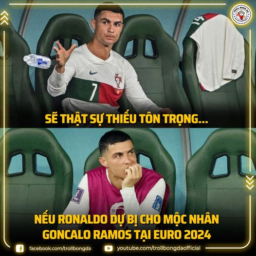

CR7 xứng đáng đá chính !

 tensor(10)


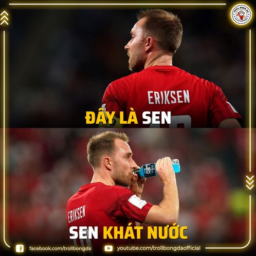

Sen này có nước để uống

 tensor(11)


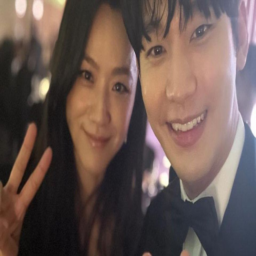

Thang Duy và Kim Soo Hyun selfie cùng nhau sau sự kiện Baeksang 2024.

 tensor(12)


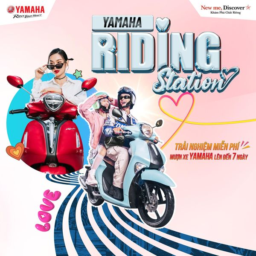

KHÔNG NÓI NHIỀU, GIAO LƯU SAO HẠNG A - CÙNG YAMAHA CHƠI LỚN VỚI CHƯƠNG TRÌNH YAMAHA RIDING STATION MƯỢN XE MIỄN PHÍ LÊN TỚI 7 NGÀY TẠI BÌNH DƯƠNG 😎
Điều đặc biệt chưa từng có, Yamaha chơi lớn với sự kiện mượn xe và trải nghiệm các dòng xe trendy của Yamaha như Grande, Janus, NVX, PG-1 trong thời gian lên đến 1 TUẦN. Không chỉ vậy, các bạn trẻ gen Z đừng bỏ lỡ cơ hội giao lưu trực tiếp với dàn celeb khủng như: Hoa hậu Đỗ Hà, Hoa hậu Tiểu Vy, Pháo, Lyly, Soobin Hoàng Sơn. ️🎉
👉 Chỉ cần truy cập link: https://ymhvn.com/Dang-ky-muon-xe-Yamaha, điền thông tin theo hướng dẫn là bạn có thể đăng ký đặt lịch mượn xe thành công nha !!!  Ai đang có nhu cầu mua xe Yamaha mà muốn đi dating cùng người ấy thì còn chần chờ gì mà chưa tham gia ngay?
️⛳ Tại AEON Mall Bình Dương từ 01/06 - 30/06, không chỉ trải nghiệm lái thử xe miễn phí tẹt ga, các bạn còn có cơ hội tham gia hàng loạt hoạt động hấp dẫn chưa từng có:
🔹Quầy photobooth chụp và in ảnh miễn phí
🔹Bói bài Tarot với đủ chủ đề tình yêu, sự nghiệp

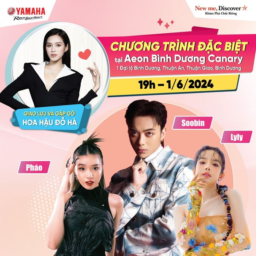

KHÔNG NÓI NHIỀU, GIAO LƯU SAO HẠNG A - CÙNG YAMAHA CHƠI LỚN VỚI CHƯƠNG TRÌNH YAMAHA RIDING STATION MƯỢN XE MIỄN PHÍ LÊN TỚI 7 NGÀY TẠI BÌNH DƯƠNG 😎
Điều đặc biệt chưa từng có, Yamaha chơi lớn với sự kiện mượn xe và trải nghiệm các dòng xe trendy của Yamaha như Grande, Janus, NVX, PG-1 trong thời gian lên đến 1 TUẦN. Không chỉ vậy, các bạn trẻ gen Z đừng bỏ lỡ cơ hội giao lưu trực tiếp với dàn celeb khủng như: Hoa hậu Đỗ Hà, Hoa hậu Tiểu Vy, Pháo, Lyly, Soobin Hoàng Sơn. ️🎉
👉 Chỉ cần truy cập link: https://ymhvn.com/Dang-ky-muon-xe-Yamaha, điền thông tin theo hướng dẫn là bạn có thể đăng ký đặt lịch mượn xe thành công nha !!!  Ai đang có nhu cầu mua xe Yamaha mà muốn đi dating cùng người ấy thì còn chần chờ gì mà chưa tham gia ngay?
️⛳ Tại AEON Mall Bình Dương từ 01/06 - 30/06, không chỉ trải nghiệm lái thử xe miễn phí tẹt ga, các bạn còn có cơ hội tham gia hàng loạt hoạt động hấp dẫn chưa từng có:
🔹Quầy photobooth chụp và in ảnh miễn phí
🔹Bói bài Tarot với đủ chủ đề tình yêu, sự nghiệp

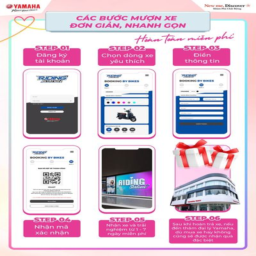

KHÔNG NÓI NHIỀU, GIAO LƯU SAO HẠNG A - CÙNG YAMAHA CHƠI LỚN VỚI CHƯƠNG TRÌNH YAMAHA RIDING STATION MƯỢN XE MIỄN PHÍ LÊN TỚI 7 NGÀY TẠI BÌNH DƯƠNG 😎
Điều đặc biệt chưa từng có, Yamaha chơi lớn với sự kiện mượn xe và trải nghiệm các dòng xe trendy của Yamaha như Grande, Janus, NVX, PG-1 trong thời gian lên đến 1 TUẦN. Không chỉ vậy, các bạn trẻ gen Z đừng bỏ lỡ cơ hội giao lưu trực tiếp với dàn celeb khủng như: Hoa hậu Đỗ Hà, Hoa hậu Tiểu Vy, Pháo, Lyly, Soobin Hoàng Sơn. ️🎉
👉 Chỉ cần truy cập link: https://ymhvn.com/Dang-ky-muon-xe-Yamaha, điền thông tin theo hướng dẫn là bạn có thể đăng ký đặt lịch mượn xe thành công nha !!!  Ai đang có nhu cầu mua xe Yamaha mà muốn đi dating cùng người ấy thì còn chần chờ gì mà chưa tham gia ngay?
️⛳ Tại AEON Mall Bình Dương từ 01/06 - 30/06, không chỉ trải nghiệm lái thử xe miễn phí tẹt ga, các bạn còn có cơ hội tham gia hàng loạt hoạt động hấp dẫn chưa từng có:
🔹Quầy photobooth chụp và in ảnh miễn phí
🔹Bói bài Tarot với đủ chủ đề tình yêu, sự nghiệp

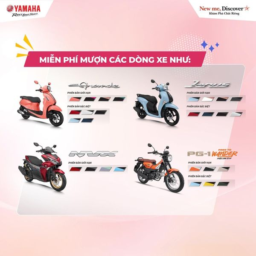

KHÔNG NÓI NHIỀU, GIAO LƯU SAO HẠNG A - CÙNG YAMAHA CHƠI LỚN VỚI CHƯƠNG TRÌNH YAMAHA RIDING STATION MƯỢN XE MIỄN PHÍ LÊN TỚI 7 NGÀY TẠI BÌNH DƯƠNG 😎
Điều đặc biệt chưa từng có, Yamaha chơi lớn với sự kiện mượn xe và trải nghiệm các dòng xe trendy của Yamaha như Grande, Janus, NVX, PG-1 trong thời gian lên đến 1 TUẦN. Không chỉ vậy, các bạn trẻ gen Z đừng bỏ lỡ cơ hội giao lưu trực tiếp với dàn celeb khủng như: Hoa hậu Đỗ Hà, Hoa hậu Tiểu Vy, Pháo, Lyly, Soobin Hoàng Sơn. ️🎉
👉 Chỉ cần truy cập link: https://ymhvn.com/Dang-ky-muon-xe-Yamaha, điền thông tin theo hướng dẫn là bạn có thể đăng ký đặt lịch mượn xe thành công nha !!!  Ai đang có nhu cầu mua xe Yamaha mà muốn đi dating cùng người ấy thì còn chần chờ gì mà chưa tham gia ngay?
️⛳ Tại AEON Mall Bình Dương từ 01/06 - 30/06, không chỉ trải nghiệm lái thử xe miễn phí tẹt ga, các bạn còn có cơ hội tham gia hàng loạt hoạt động hấp dẫn chưa từng có:
🔹Quầy photobooth chụp và in ảnh miễn phí
🔹Bói bài Tarot với đủ chủ đề tình yêu, sự nghiệp

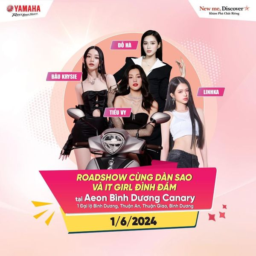

KHÔNG NÓI NHIỀU, GIAO LƯU SAO HẠNG A - CÙNG YAMAHA CHƠI LỚN VỚI CHƯƠNG TRÌNH YAMAHA RIDING STATION MƯỢN XE MIỄN PHÍ LÊN TỚI 7 NGÀY TẠI BÌNH DƯƠNG 😎
Điều đặc biệt chưa từng có, Yamaha chơi lớn với sự kiện mượn xe và trải nghiệm các dòng xe trendy của Yamaha như Grande, Janus, NVX, PG-1 trong thời gian lên đến 1 TUẦN. Không chỉ vậy, các bạn trẻ gen Z đừng bỏ lỡ cơ hội giao lưu trực tiếp với dàn celeb khủng như: Hoa hậu Đỗ Hà, Hoa hậu Tiểu Vy, Pháo, Lyly, Soobin Hoàng Sơn. ️🎉
👉 Chỉ cần truy cập link: https://ymhvn.com/Dang-ky-muon-xe-Yamaha, điền thông tin theo hướng dẫn là bạn có thể đăng ký đặt lịch mượn xe thành công nha !!!  Ai đang có nhu cầu mua xe Yamaha mà muốn đi dating cùng người ấy thì còn chần chờ gì mà chưa tham gia ngay?
️⛳ Tại AEON Mall Bình Dương từ 01/06 - 30/06, không chỉ trải nghiệm lái thử xe miễn phí tẹt ga, các bạn còn có cơ hội tham gia hàng loạt hoạt động hấp dẫn chưa từng có:
🔹Quầy photobooth chụp và in ảnh miễn phí
🔹Bói bài Tarot với đủ chủ đề tình yêu, sự nghiệp

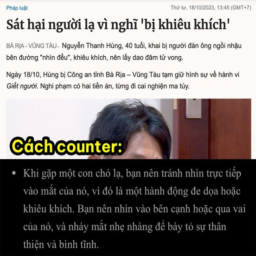

Cẩm nang sinh tồn ở Việt Nam 🙏
#interpool

 tensor(18)


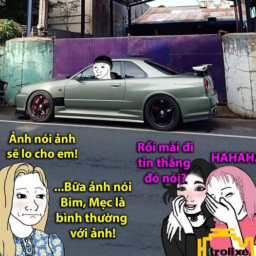

Chạy xe đời Tống mà đòi lo cho ai?

 tensor(19)


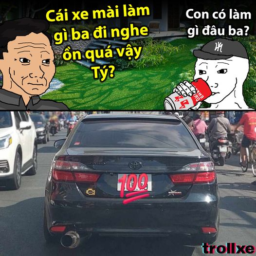

Mài thề đi?

 tensor(20)


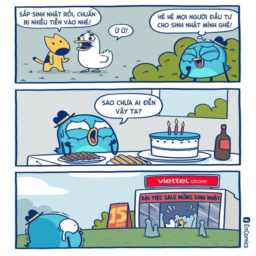

thứ bạn bè vì sale phản bội
#ViettelStore #DaiTiecSale

 tensor(21)


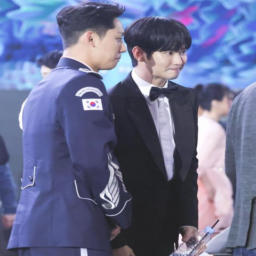

Lee Do Hyun và Kim Soo Hyun chung khung hình: Một anh lính và một chú rể đến tham dự lễ trao giải phim ảnh.

 tensor(22)


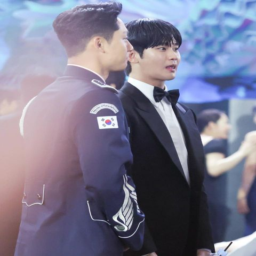

Lee Do Hyun và Kim Soo Hyun chung khung hình: Một anh lính và một chú rể đến tham dự lễ trao giải phim ảnh.

 tensor(23)


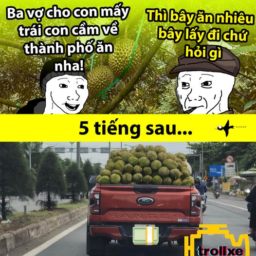

Ông già vợ lỡ mồm

 tensor(24)


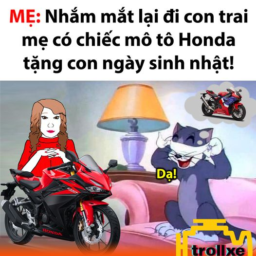

Mẹ đi mua SH mẹ thấy nên mẹ lấy cho con!

 tensor(25)


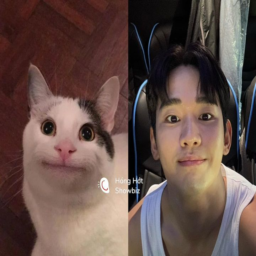

Meme của Kim Soo Man đang được fan quốc tế truyền tay nhau:

 tensor(26)


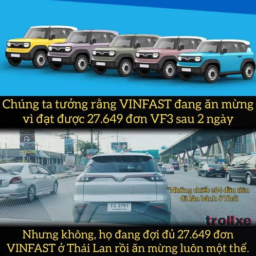

Có thể bạn chưa biết

 tensor(27)


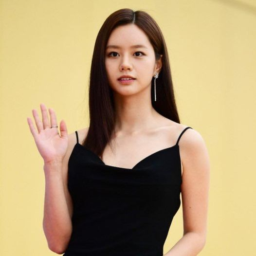

HYERI KHÔNG GIA HẠN HỢP ĐỒNG CTY SAU KHI CTY QUẢN LÝ CỦA RYU JUN YEOL MUA LẠI
Hyeri được cho là đã quyết định không gia hạn hợp đồng với công ty quản lý của cô ấy, Creative Group ING sau khi làm việc với công ty quản lý trong 5 năm kể từ năm 2019.
Tuy nhiên, công ty của cô cho biết thời hạn hợp đồng của Hyeri vẫn còn, chỉ là không chắc chắn về việc gia hạn.
Trước đó Creative Group ING đã được CJes Studios - công ty quản lý Ryu Jun Yeol mua lại.

 tensor(28)


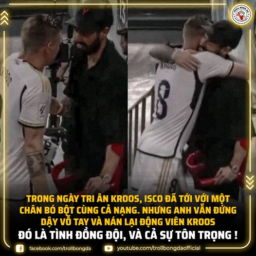

Sự tôn trọng 😊

 tensor(29)


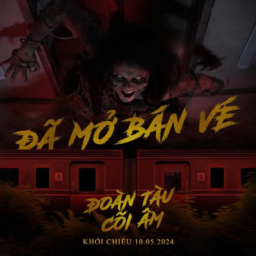

Đoàn tàu ngập vong ám ảnh nhất tháng 5 chính thức mở bán vé ❗ 
Từng toa tàu lần lượt biến mất mỗi khi xuyên qua đường hầm, hàng loạt viễn cảnh ghê rợn liên tiếp ập đến khiến chuyến nghỉ dưỡng trong mơ bỗng hóa cơn ác mộng kinh hoàng.
TÀU CHẠY, VONG THEO, THÂY MA CHỒNG CHẤT 💀 
🚂  ĐOÀN TÀU CÕI ÂM - Chính thức khởi hành: 10.05.2024.

 tensor(30)


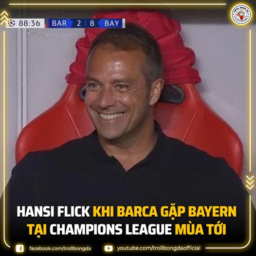

Chúc mừng Hansi Flick chính thức trở thành tân HLV Barca 😅

 tensor(31)


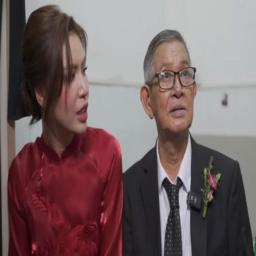

Khi thấy sức khoẻ ba yếu, Minh Tú gấp rút chuẩn bị lễ đính hôn để ba có thể an tâm nhìn con gái của mình lấy chồng. Lúc Minh Tú muốn kêu thợ may bộ vest cho ba mặc vào ngày vui, ông nói: “Ba sắp mất rồi, lấy đồ cũ bận được rồi, may chi tốn tiền”. Lễ đính hôn diễn ra trong căn nhà của ba mẹ Minh Tú ở xóm lao động chỉ sau 10 ngày chuẩn bị. Sau đó, cô cũng nhắn nhủ “ba ráng đợi con nha, qua Tết con cưới rồi ba dắt con lên lễ đường” nhưng ông nói: “Chắc không kịp rồi Tú ơi”...

 tensor(32)


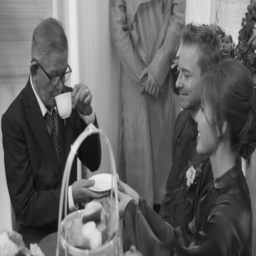

Khi thấy sức khoẻ ba yếu, Minh Tú gấp rút chuẩn bị lễ đính hôn để ba có thể an tâm nhìn con gái của mình lấy chồng. Lúc Minh Tú muốn kêu thợ may bộ vest cho ba mặc vào ngày vui, ông nói: “Ba sắp mất rồi, lấy đồ cũ bận được rồi, may chi tốn tiền”. Lễ đính hôn diễn ra trong căn nhà của ba mẹ Minh Tú ở xóm lao động chỉ sau 10 ngày chuẩn bị. Sau đó, cô cũng nhắn nhủ “ba ráng đợi con nha, qua Tết con cưới rồi ba dắt con lên lễ đường” nhưng ông nói: “Chắc không kịp rồi Tú ơi”...

 tensor(33)


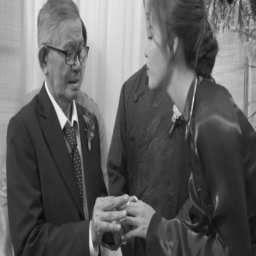

Khi thấy sức khoẻ ba yếu, Minh Tú gấp rút chuẩn bị lễ đính hôn để ba có thể an tâm nhìn con gái của mình lấy chồng. Lúc Minh Tú muốn kêu thợ may bộ vest cho ba mặc vào ngày vui, ông nói: “Ba sắp mất rồi, lấy đồ cũ bận được rồi, may chi tốn tiền”. Lễ đính hôn diễn ra trong căn nhà của ba mẹ Minh Tú ở xóm lao động chỉ sau 10 ngày chuẩn bị. Sau đó, cô cũng nhắn nhủ “ba ráng đợi con nha, qua Tết con cưới rồi ba dắt con lên lễ đường” nhưng ông nói: “Chắc không kịp rồi Tú ơi”...

 tensor(34)


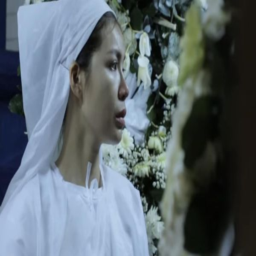

Khi thấy sức khoẻ ba yếu, Minh Tú gấp rút chuẩn bị lễ đính hôn để ba có thể an tâm nhìn con gái của mình lấy chồng. Lúc Minh Tú muốn kêu thợ may bộ vest cho ba mặc vào ngày vui, ông nói: “Ba sắp mất rồi, lấy đồ cũ bận được rồi, may chi tốn tiền”. Lễ đính hôn diễn ra trong căn nhà của ba mẹ Minh Tú ở xóm lao động chỉ sau 10 ngày chuẩn bị. Sau đó, cô cũng nhắn nhủ “ba ráng đợi con nha, qua Tết con cưới rồi ba dắt con lên lễ đường” nhưng ông nói: “Chắc không kịp rồi Tú ơi”...

 tensor(35)


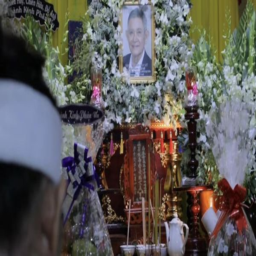

Khi thấy sức khoẻ ba yếu, Minh Tú gấp rút chuẩn bị lễ đính hôn để ba có thể an tâm nhìn con gái của mình lấy chồng. Lúc Minh Tú muốn kêu thợ may bộ vest cho ba mặc vào ngày vui, ông nói: “Ba sắp mất rồi, lấy đồ cũ bận được rồi, may chi tốn tiền”. Lễ đính hôn diễn ra trong căn nhà của ba mẹ Minh Tú ở xóm lao động chỉ sau 10 ngày chuẩn bị. Sau đó, cô cũng nhắn nhủ “ba ráng đợi con nha, qua Tết con cưới rồi ba dắt con lên lễ đường” nhưng ông nói: “Chắc không kịp rồi Tú ơi”...

 tensor(36)


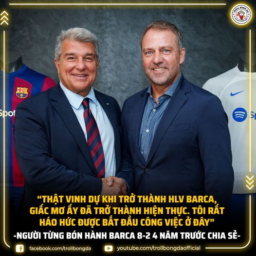

Đầu tiên quan trọng vẫn là đọc pass :v

 tensor(37)


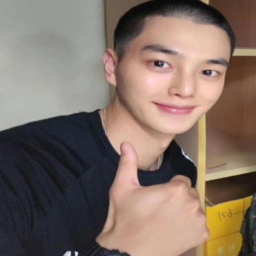

Giao diện của Song Kang trong quân ngũ.

 tensor(38)


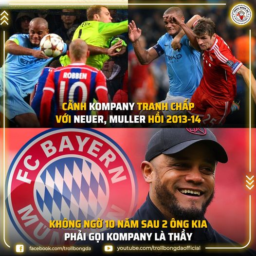

Thi thoảng mấy thầy trò lại rủ nhau solo 1vs1

 tensor(39)


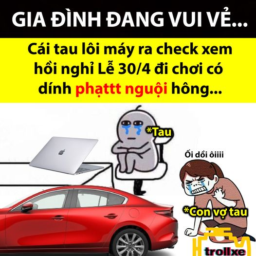

Gòy xong

 tensor(40)


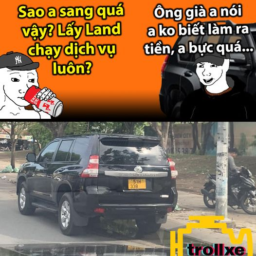

“A chạy để chứng minh với gia đình thôi. Chứ kiếm ko đủ đổ xăng cái Bentley a chạy đi ăn sáng nữa!” – Cậu Ba

 tensor(41)


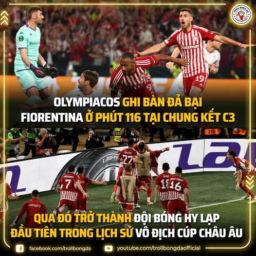

Quá bản lĩnh, chúc mừng Olympiacos!

 tensor(42)


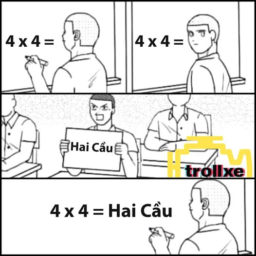

Ủa sai chỗ nào Thầy? Sai chỗ nào???

 tensor(43)


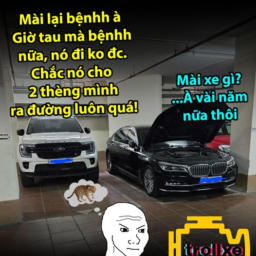

Sớm muộn gì hai thèng bey cũng ra đường

 tensor(44)


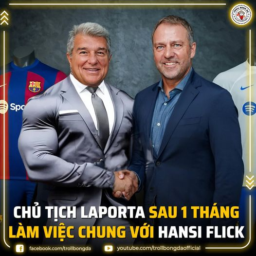

Yên tâm, vào tay thầy là đô hết

 tensor(45)


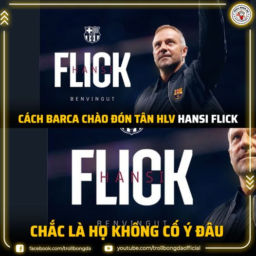

Tất cả do cái font :))

 tensor(46)


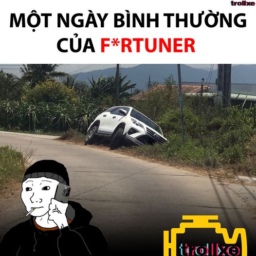

Anh Tư bo cua hơi lố

 tensor(47)


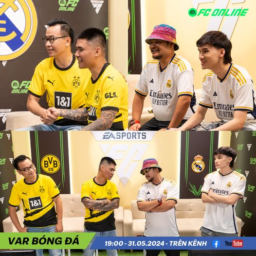

"Chiến thần ngôn ngữ, chúa tể ngôn từ, ông hoàng cảm xúc” Tạ Biên Cương sẽ đặt niềm tin vào đội bóng nào trong trận Chung kết Champions League năm nay giữa Real Madrid và Borussia Dortmund? 
Đón chờ những màn “VAR cực căng”, những pha pressing “khét lẹt” của anh Tạ Biên Cương và các khách mời trong Tập 5 VAR Bóng Đá sẽ phát sóng vào 19h00 ngày 31/05 phát sóng trên kênh chính thức của FC Online
Cơ hội cuối để anh em vào trang https://var.fconline.garena.vn để cùng dự đoán tỉ số trận Showmatch của các khách mời và có cơ hội trúng chuyến đi Châu Âu xem EURO, Macbook và nhiều phần quà hấp dẫn nhé!!! 
#VarBongDa #FCOnline #DiChauAuXemEuro

 tensor(48)


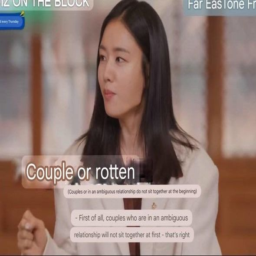

AHN EUN JIN TIẾT LỘ CÁCH CÔ “BẮT BÀI” CÁC COUPLE TRONG CÁC BỮA TIỆC, KNET PHÁT HIỆN TRÙNG KHỚP VỚI KIM SOO HYUN VÀ KIM JI WON 
Trong You Quiz on the Block, Ahn Eun Jin tiết lộ cách cô ấy xác định các cặp đôi yêu nhau dựa trên hành vi tại các bữa tiệc tối. Nữ diễn viên đã phát hiện 11 cặp đôi được tạo ra từ quá trình quay phim My Dearest của mình &amp; đây là cách cô ấy thường xác định các cặp đôi yêu nhau: 
1. Họ sẽ không ngồi cùng nhau vào đầu bữa tiệc tối.
2. Một khi họ hơi say, họ sẽ ngồi cùng bàn vì họ muốn chăm sóc lẫn nhau.
Từ đó dân mạng suy đoán Kim Soohyun và Kim Jiwon có khả năng đang hẹn hò trong đời thực, vì: 
- Không có bức ảnh Jiwon ngồi cạnh Soohyun nào trong khi bắt đầu bữa tối mừng công. 
- Giám đốc điều hành Hz &amp; Pje ban đầu ngồi cạnh Kim Jiwon, nhưng cô ấy để Kim Soohyun ngồi cạnh Jiwon ở giữa bữa tiệc (túi pje trên ghế của Kim Soohyun ngồi).
- Những người trong cuộc nói rằng Kim Soohyun cũng đang chăm sóc Kim Jiwon, Một số người nói rằng họ đã thấy anh ta đưa kh

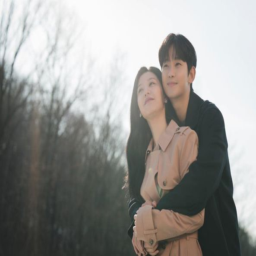

AHN EUN JIN TIẾT LỘ CÁCH CÔ “BẮT BÀI” CÁC COUPLE TRONG CÁC BỮA TIỆC, KNET PHÁT HIỆN TRÙNG KHỚP VỚI KIM SOO HYUN VÀ KIM JI WON 
Trong You Quiz on the Block, Ahn Eun Jin tiết lộ cách cô ấy xác định các cặp đôi yêu nhau dựa trên hành vi tại các bữa tiệc tối. Nữ diễn viên đã phát hiện 11 cặp đôi được tạo ra từ quá trình quay phim My Dearest của mình &amp; đây là cách cô ấy thường xác định các cặp đôi yêu nhau: 
1. Họ sẽ không ngồi cùng nhau vào đầu bữa tiệc tối.
2. Một khi họ hơi say, họ sẽ ngồi cùng bàn vì họ muốn chăm sóc lẫn nhau.
Từ đó dân mạng suy đoán Kim Soohyun và Kim Jiwon có khả năng đang hẹn hò trong đời thực, vì: 
- Không có bức ảnh Jiwon ngồi cạnh Soohyun nào trong khi bắt đầu bữa tối mừng công. 
- Giám đốc điều hành Hz &amp; Pje ban đầu ngồi cạnh Kim Jiwon, nhưng cô ấy để Kim Soohyun ngồi cạnh Jiwon ở giữa bữa tiệc (túi pje trên ghế của Kim Soohyun ngồi).
- Những người trong cuộc nói rằng Kim Soohyun cũng đang chăm sóc Kim Jiwon, Một số người nói rằng họ đã thấy anh ta đưa kh

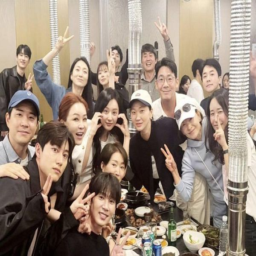

AHN EUN JIN TIẾT LỘ CÁCH CÔ “BẮT BÀI” CÁC COUPLE TRONG CÁC BỮA TIỆC, KNET PHÁT HIỆN TRÙNG KHỚP VỚI KIM SOO HYUN VÀ KIM JI WON 
Trong You Quiz on the Block, Ahn Eun Jin tiết lộ cách cô ấy xác định các cặp đôi yêu nhau dựa trên hành vi tại các bữa tiệc tối. Nữ diễn viên đã phát hiện 11 cặp đôi được tạo ra từ quá trình quay phim My Dearest của mình &amp; đây là cách cô ấy thường xác định các cặp đôi yêu nhau: 
1. Họ sẽ không ngồi cùng nhau vào đầu bữa tiệc tối.
2. Một khi họ hơi say, họ sẽ ngồi cùng bàn vì họ muốn chăm sóc lẫn nhau.
Từ đó dân mạng suy đoán Kim Soohyun và Kim Jiwon có khả năng đang hẹn hò trong đời thực, vì: 
- Không có bức ảnh Jiwon ngồi cạnh Soohyun nào trong khi bắt đầu bữa tối mừng công. 
- Giám đốc điều hành Hz &amp; Pje ban đầu ngồi cạnh Kim Jiwon, nhưng cô ấy để Kim Soohyun ngồi cạnh Jiwon ở giữa bữa tiệc (túi pje trên ghế của Kim Soohyun ngồi).
- Những người trong cuộc nói rằng Kim Soohyun cũng đang chăm sóc Kim Jiwon, Một số người nói rằng họ đã thấy anh ta đưa kh

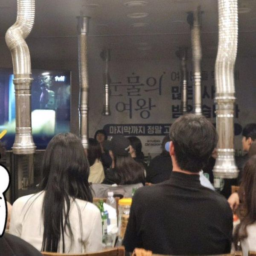

AHN EUN JIN TIẾT LỘ CÁCH CÔ “BẮT BÀI” CÁC COUPLE TRONG CÁC BỮA TIỆC, KNET PHÁT HIỆN TRÙNG KHỚP VỚI KIM SOO HYUN VÀ KIM JI WON 
Trong You Quiz on the Block, Ahn Eun Jin tiết lộ cách cô ấy xác định các cặp đôi yêu nhau dựa trên hành vi tại các bữa tiệc tối. Nữ diễn viên đã phát hiện 11 cặp đôi được tạo ra từ quá trình quay phim My Dearest của mình &amp; đây là cách cô ấy thường xác định các cặp đôi yêu nhau: 
1. Họ sẽ không ngồi cùng nhau vào đầu bữa tiệc tối.
2. Một khi họ hơi say, họ sẽ ngồi cùng bàn vì họ muốn chăm sóc lẫn nhau.
Từ đó dân mạng suy đoán Kim Soohyun và Kim Jiwon có khả năng đang hẹn hò trong đời thực, vì: 
- Không có bức ảnh Jiwon ngồi cạnh Soohyun nào trong khi bắt đầu bữa tối mừng công. 
- Giám đốc điều hành Hz &amp; Pje ban đầu ngồi cạnh Kim Jiwon, nhưng cô ấy để Kim Soohyun ngồi cạnh Jiwon ở giữa bữa tiệc (túi pje trên ghế của Kim Soohyun ngồi).
- Những người trong cuộc nói rằng Kim Soohyun cũng đang chăm sóc Kim Jiwon, Một số người nói rằng họ đã thấy anh ta đưa kh

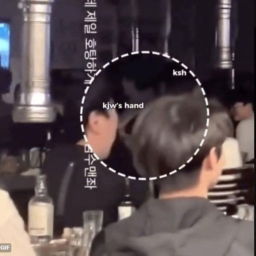

AHN EUN JIN TIẾT LỘ CÁCH CÔ “BẮT BÀI” CÁC COUPLE TRONG CÁC BỮA TIỆC, KNET PHÁT HIỆN TRÙNG KHỚP VỚI KIM SOO HYUN VÀ KIM JI WON 
Trong You Quiz on the Block, Ahn Eun Jin tiết lộ cách cô ấy xác định các cặp đôi yêu nhau dựa trên hành vi tại các bữa tiệc tối. Nữ diễn viên đã phát hiện 11 cặp đôi được tạo ra từ quá trình quay phim My Dearest của mình &amp; đây là cách cô ấy thường xác định các cặp đôi yêu nhau: 
1. Họ sẽ không ngồi cùng nhau vào đầu bữa tiệc tối.
2. Một khi họ hơi say, họ sẽ ngồi cùng bàn vì họ muốn chăm sóc lẫn nhau.
Từ đó dân mạng suy đoán Kim Soohyun và Kim Jiwon có khả năng đang hẹn hò trong đời thực, vì: 
- Không có bức ảnh Jiwon ngồi cạnh Soohyun nào trong khi bắt đầu bữa tối mừng công. 
- Giám đốc điều hành Hz &amp; Pje ban đầu ngồi cạnh Kim Jiwon, nhưng cô ấy để Kim Soohyun ngồi cạnh Jiwon ở giữa bữa tiệc (túi pje trên ghế của Kim Soohyun ngồi).
- Những người trong cuộc nói rằng Kim Soohyun cũng đang chăm sóc Kim Jiwon, Một số người nói rằng họ đã thấy anh ta đưa kh

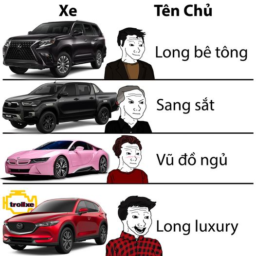

Y vậy

 tensor(54)


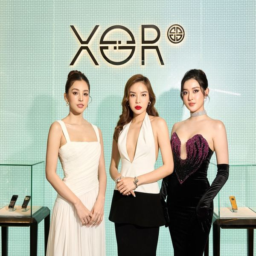

HOA HẬU KỲ DUYÊN, TIỂU VY, HUYỀN MY ĐỌ SẮC BÊN CẠNH ĐIỆN THOẠI 1 TỶ CÙNG TIKTOKER DUY THẨM
Một bức ảnh không chỉ có nhan sắc, sự thông minh hài hước mà còn có cả 1 tỷ!!!
Được biết bộ 3 nàng hậu cùng Tiktoker Duy Thẩm đã có màn hội ngộ tại boutique độc nhất ở Đông Nam Á của "Điện thoại 1 tỷ" XOR mới khai trương tại Hàng Bài.
Tại đây hội người nổi tiếng không chỉ được giao lưu, chụp ảnh cùng phiên bản điện thoại 1 tỷ XOR Elite Gold mà còn được gặp gỡ ông Hutch Hutchison - Giám đốc thiết kế của XOR cùng các đại diện của Đại sứ quán Anh tại Việt Nam. Đồng thời cũng được chiêm ngưỡng màn biểu diễn chế tác thủ công để hoàn thiện một chiếc điện thoại XOR bởi ông Mark Browne - Global Operation Officer của XOR.
Xem mà chỉ biết ước, không biết lương 5 triệu bao giờ mới được chạm vào điện thoại 1 tỷ này mất!!
#XORVietnam #XORBoutique #Grandopening #dienthoai1ty

 tensor(55)


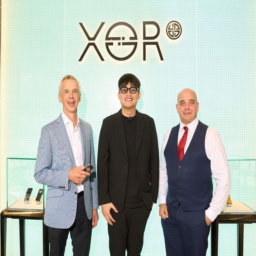

HOA HẬU KỲ DUYÊN, TIỂU VY, HUYỀN MY ĐỌ SẮC BÊN CẠNH ĐIỆN THOẠI 1 TỶ CÙNG TIKTOKER DUY THẨM
Một bức ảnh không chỉ có nhan sắc, sự thông minh hài hước mà còn có cả 1 tỷ!!!
Được biết bộ 3 nàng hậu cùng Tiktoker Duy Thẩm đã có màn hội ngộ tại boutique độc nhất ở Đông Nam Á của "Điện thoại 1 tỷ" XOR mới khai trương tại Hàng Bài.
Tại đây hội người nổi tiếng không chỉ được giao lưu, chụp ảnh cùng phiên bản điện thoại 1 tỷ XOR Elite Gold mà còn được gặp gỡ ông Hutch Hutchison - Giám đốc thiết kế của XOR cùng các đại diện của Đại sứ quán Anh tại Việt Nam. Đồng thời cũng được chiêm ngưỡng màn biểu diễn chế tác thủ công để hoàn thiện một chiếc điện thoại XOR bởi ông Mark Browne - Global Operation Officer của XOR.
Xem mà chỉ biết ước, không biết lương 5 triệu bao giờ mới được chạm vào điện thoại 1 tỷ này mất!!
#XORVietnam #XORBoutique #Grandopening #dienthoai1ty

 tensor(56)


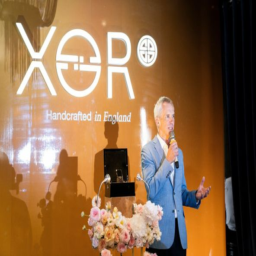

HOA HẬU KỲ DUYÊN, TIỂU VY, HUYỀN MY ĐỌ SẮC BÊN CẠNH ĐIỆN THOẠI 1 TỶ CÙNG TIKTOKER DUY THẨM
Một bức ảnh không chỉ có nhan sắc, sự thông minh hài hước mà còn có cả 1 tỷ!!!
Được biết bộ 3 nàng hậu cùng Tiktoker Duy Thẩm đã có màn hội ngộ tại boutique độc nhất ở Đông Nam Á của "Điện thoại 1 tỷ" XOR mới khai trương tại Hàng Bài.
Tại đây hội người nổi tiếng không chỉ được giao lưu, chụp ảnh cùng phiên bản điện thoại 1 tỷ XOR Elite Gold mà còn được gặp gỡ ông Hutch Hutchison - Giám đốc thiết kế của XOR cùng các đại diện của Đại sứ quán Anh tại Việt Nam. Đồng thời cũng được chiêm ngưỡng màn biểu diễn chế tác thủ công để hoàn thiện một chiếc điện thoại XOR bởi ông Mark Browne - Global Operation Officer của XOR.
Xem mà chỉ biết ước, không biết lương 5 triệu bao giờ mới được chạm vào điện thoại 1 tỷ này mất!!
#XORVietnam #XORBoutique #Grandopening #dienthoai1ty

 tensor(57)


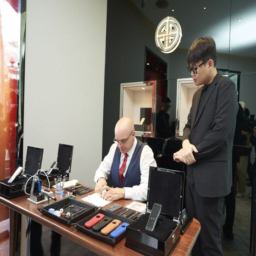

HOA HẬU KỲ DUYÊN, TIỂU VY, HUYỀN MY ĐỌ SẮC BÊN CẠNH ĐIỆN THOẠI 1 TỶ CÙNG TIKTOKER DUY THẨM
Một bức ảnh không chỉ có nhan sắc, sự thông minh hài hước mà còn có cả 1 tỷ!!!
Được biết bộ 3 nàng hậu cùng Tiktoker Duy Thẩm đã có màn hội ngộ tại boutique độc nhất ở Đông Nam Á của "Điện thoại 1 tỷ" XOR mới khai trương tại Hàng Bài.
Tại đây hội người nổi tiếng không chỉ được giao lưu, chụp ảnh cùng phiên bản điện thoại 1 tỷ XOR Elite Gold mà còn được gặp gỡ ông Hutch Hutchison - Giám đốc thiết kế của XOR cùng các đại diện của Đại sứ quán Anh tại Việt Nam. Đồng thời cũng được chiêm ngưỡng màn biểu diễn chế tác thủ công để hoàn thiện một chiếc điện thoại XOR bởi ông Mark Browne - Global Operation Officer của XOR.
Xem mà chỉ biết ước, không biết lương 5 triệu bao giờ mới được chạm vào điện thoại 1 tỷ này mất!!
#XORVietnam #XORBoutique #Grandopening #dienthoai1ty

 tensor(58)


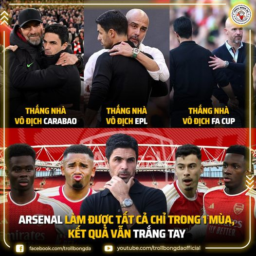

Cúp trong lòng người hâm mộ là được rồi :v

 tensor(59)


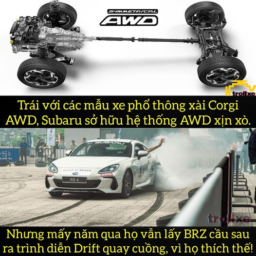

Nói không với cầu trước
Nói không với cầu trời

 tensor(60)


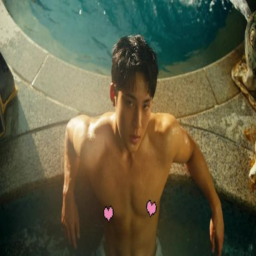

Mingyu (SEVENTEEN) trong MV LALALI. Chồng của bà nào thì vào khoác áo che cho ảnh đi.

 tensor(61)


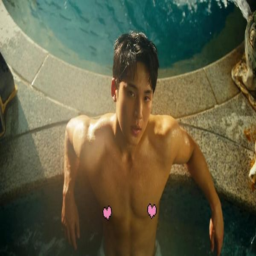

Mingyu (SEVENTEEN) trong MV LALALI. Chồng của bà nào thì vào khoác áo che cho ảnh đi.

 tensor(62)


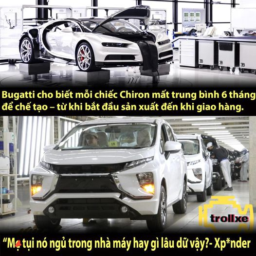

Bey ngủ trong nhà máy hay gì làm 6 tháng/chiếc?

 tensor(63)


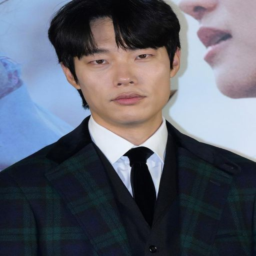

RYU JUN YEOL LÊN TIẾNG VỀ CÁC ỒN ÀO CÁ NHÂN: “VÀO THỜI ĐIỂM ĐÓ, TÔI NGHĨ TỐT NHẤT LÀ IM LẶNG”
Nam diễn viên Ryu Jun-yeol nói về những tranh cãi gần đây tại buổi giới thiệu phim mới của Netflix 'The 8 Show' được tổ chức tại Jung-gu, Seoul: 
“Giữa các vấn đề liên quan đến cuộc sống cá nhân của tôi, nhiều bài đăng được đăng lên mạng xã hội trái với ý muốn của tôi và tôi nghĩ tốt nhất là giữ im lặng vào thời điểm đó, thay vì trả lời từng bài một. Khi tham dự buổi chơi golf chuyên nghiệp ở Mỹ, tôi cũng thấy những ý kiến ​​​​chỉ trích về những câu chuyện liên quan. Đó là dịp để nhìn lại bản thân mình”. 
Sau đó anh ấy tuyên bố: “Vì đây là vấn đề cá nhân nên tôi muốn nó riêng tư hơn”.

 tensor(64)


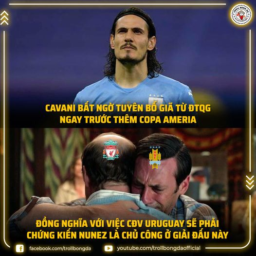

Tập xác định :)))

 tensor(65)


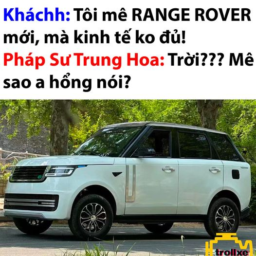

Đừng nói khó với em

 tensor(66)


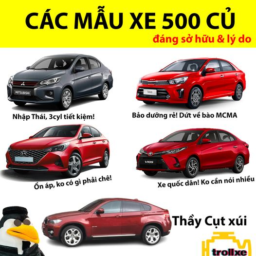

Được rồi! Chơi!!!

 tensor(67)


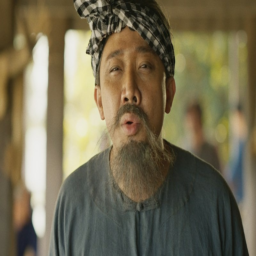

Trấn Thành method acting 😲
#interpool

 tensor(68)


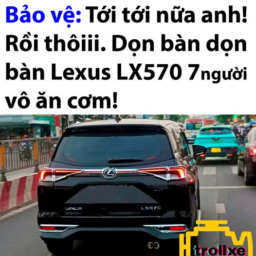

Anh gửi chú 50 uống cà phê!

 tensor(69)


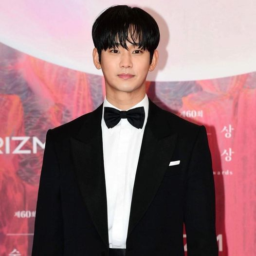

Kiểu tóc rũ như ướt mưa của Kim Soo Hyun tại Baeksang 2024 được Baek Heungkwon - CEO của salon làm tóc nổi tiếng của Seoul - HE:ARTS Dosan đích thân làm. Phần make-up do Giám đốc trang điểm Kim Soobin thực hiện.
Fan: Ơ, người họ Baek, người tên Soobin, tất cả có thật là trùng hợp không thế.

 tensor(70)


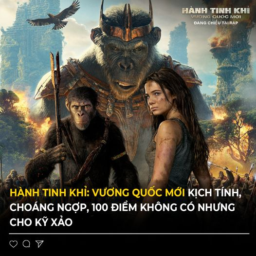

Thương hiệu Hành Tinh Khỉ đã trở lại và hoành tráng hơn gấp bội 
Ai mê phim ảnh thì chắc cũng từng một lần nghe qua Hành Tinh Khỉ - thương hiệu kinh điển của Hollywood. Mỗi phần phim đều là một kiệt tác cả về nội dung lẫn hình ảnh, kỹ xảo. Sau khi kết thúc phần phim năm 2017, Caesar đã tạo nên một thế giới mới cho loài khỉ. Vài trăm năm trôi qua, loài khỉ ngày càng trở nên thông minh còn con người thì thoái hóa dần. 
Caesar đã trở thành một huyền thoại lãng quên nhưng khát vọng của ông về một xã hội loài khỉ độc lập vẫn còn đó. Thế nhưng, dưới một thế lực đầy toan tính, ý chí đó đã bị bẻ cong nhằm thao túng thống trị cả loài khỉ. Chú khỉ trẻ Noa với ý chí kế thừa của Caesar và cô gái loài người Mae phải cùng nhau chống lại kẻ bạo chúa nhân danh Caesar để nô dịch tất cả.
Sự trở lại của Hành Tinh Khỉ xứng đáng 100 điểm hoàn hảo không có nhưng cho CGI. Cả thế giới hậu tận thế hoang tàn, đổ nát hiện lên với những tòa cao ốc quen thuộc nay phủ đầy cây xanh. Thành phố từng đầy xe cộ qua lại 

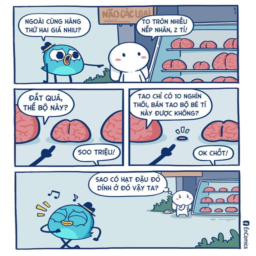

cuối cùng cũng sắm cho mình được một bộ não

 tensor(72)


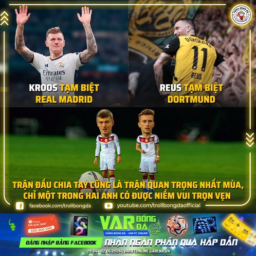

Nghe bảo fan Reus đông lắm mà fan Toni Kroos có vẻ đông hơn nhỉ? Có tận 85% người chọn Real vô địch trên trang Var Bóng Đá. Fan anh Reus đâu cả rồi? Hi vọng anh sẽ có một cái kết Happy Ending!
À đừng quên đăng nhập trang Var Bóng Đá cuối tuần này để được tặng 1000 điểm, rồi dự đoán trận chung kết C1 để rinh về ngay Voucher Shopee 50k khi đoán đúng nha.
L.ink dự đoán ở dưới phần bình luận!
#VarBongDa #FCOnline #DiChauAuXemEuro

 tensor(73)


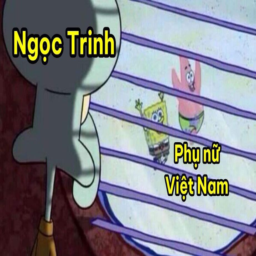

Phòng giam lạnh lẽo cần người sưởi ấm 💔
#interpool

 tensor(74)


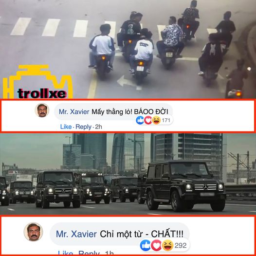

Đời

 tensor(75)


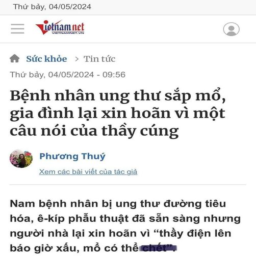

=))))))))

 tensor(76)


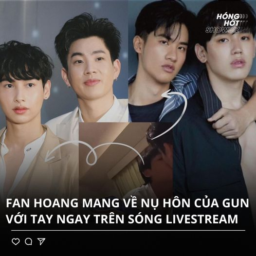

Các fan của BL Thái Lan hoang mang từ đêm qua khi trên sóng livestream của 2 couple OffGun và TayNew, New vô tình quay camera trúng lúc Gun hun Tay. 
Đoạn video này hiện được viral mạnh trên các trang MXH về phim boylove cũng như về 2 couple này.

 tensor(77)


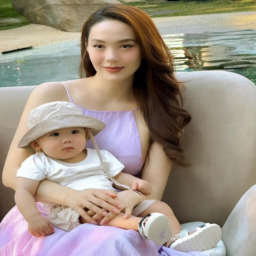

Minh Hằng đăng ảnh Bé Mỡ phụng phịu trong vòng tay mẹ.

 tensor(78)


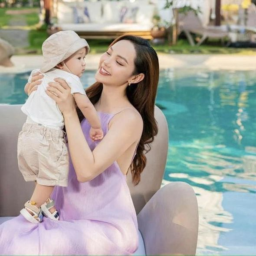

Minh Hằng đăng ảnh Bé Mỡ phụng phịu trong vòng tay mẹ.

 tensor(79)


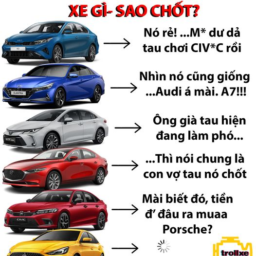

Nó là như vậy

 tensor(80)


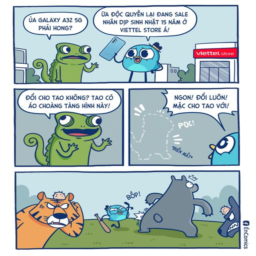

Nay tao đã có áo tàng hình nhờ đổi Samsung Galaxy A32 với Tắc kè, chúng mày làm gì được tao?
#viettelstore #samsung #GalaxyA32_5G

 tensor(81)


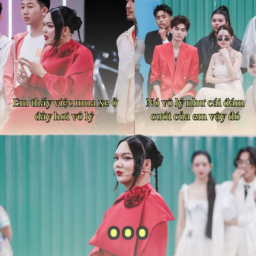

Top những thứ bí ẩn nhất ngành livestream bán hàng:
Top 1 - Đám cưới mentor Phạm Thoại
Trước thắc mắc từ Phạm Thoại về sự vô lý khi ngày tận thế nhưng lại có người đi mua xe đạp trong phần thi của team Lucie - Tuấn Dương, cặp đôi đã không ngại đôi co lại: “Nó cũng vô lý như cái đám cưới của em vậy đó. Nó là yếu tố viral mà”.
Sau phần đáp trả, “nữ hoàng drama” Phạm Thoại chỉ biết cười sượng trân, trong khi mentor Long Chun và Call Me Duy được dịp cười hả hê trước độ mặn mà đến bất ngờ từ Lucie Nguyễn. 
Phạm Thoại cũng không chịu thua khi căng cực phản bác lại: “Phạm Thoại vô lý nhưng mà vô lý để giải trí, còn trong kinh doanh mà vô lý thì team mình đi giải thích với nhãn hàng đi”.

 tensor(82)


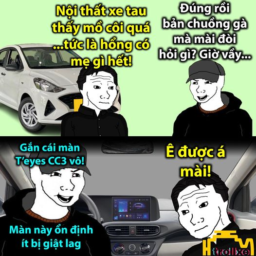

Chuồng gà hoá luxury!

 tensor(83)


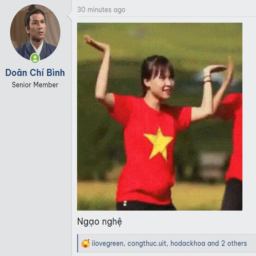

#VOZ_F33 - Báo chí nước ngoài nhận định kinh tế Việt Nam là “con rồng trỗi dậy”
https://voz.vn/.../bao-chi-nuoc-ngoai-nhan-dinh-kinh-te.../

 tensor(84)


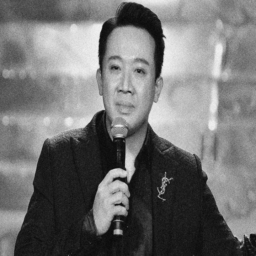

Lúc mà gặp lại Dũng, Thành có nói: "Còn nhớ cái lúc mà tôi nói rằng sự ra đời của Đất rừng phương Nam có thể tạo ra chuỗi phản ứng dẫn đến sự diệt vong của toàn bộ lịch sử Việt Nam không anh Dũng? Tôi nghĩ tôi đã thật sự làm được điều đó".
#interpool

 tensor(85)


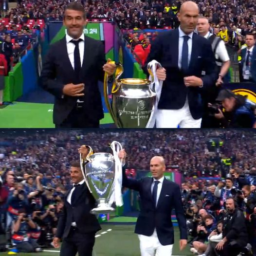

Cúp đã vào sân

 tensor(86)


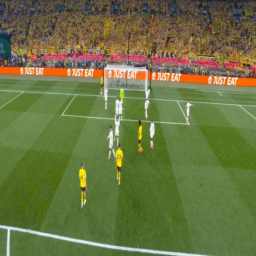

Quả khán đài bên Dortmund nhìn phê thật

 tensor(87)


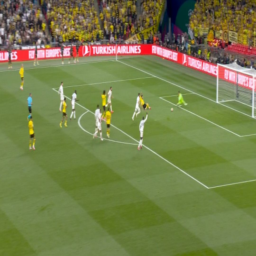

Lần này bóng trúng cột dọc!!!!!
Dortmund đen như gỗ mun

 tensor(88)


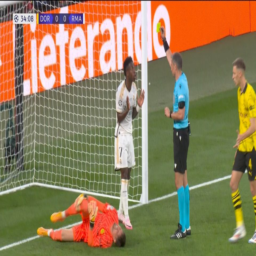

Để im cho anh ấy chơi bóng

 tensor(89)


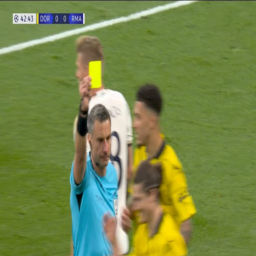

Trọng tài rất tích cực rút thẻ

 tensor(90)


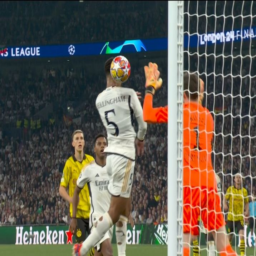

Bellingham mà kết liễu đội bóng cũ thì thật là đau đớn.
Nhưng kịch bản đó chưa xảy ra

 tensor(91)


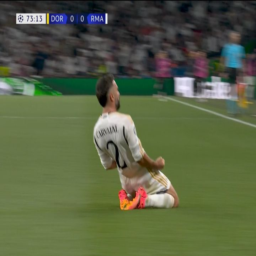

VÀOOOOOOOOOOOO
KỊCH BẢN QUEN THUỘC
1-0 cho Real Madrid

 tensor(92)


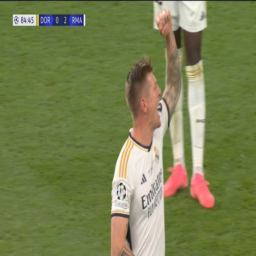

Khoảnh khắc cuối cùng của Kroos trong màu áo Real Madrid.
Cuộc chia tay không thể trọn vẹn hơn!

 tensor(93)


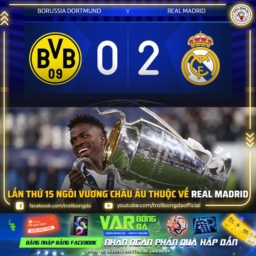

Chúc mừng Real Madrid trở thành nhà vô địch Champions League mùa giải 2023/24.
Ae vào Var Bóng đá nhận điểm, đổi quà ngay nhé! L.ink ở dưới phần bình luận.
#VarBongDa #FCOnline #DiChauAuXemEuro

 tensor(94)


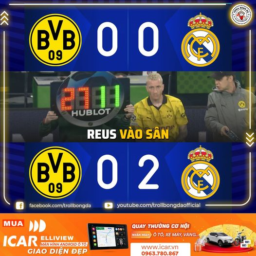

Không còn gì đau hơn

 tensor(95)


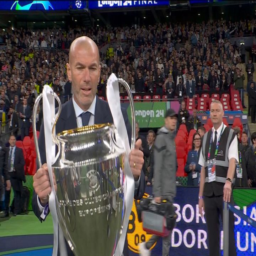

Zidane cầm cúp trao cho Real Madrid :v

 tensor(96)


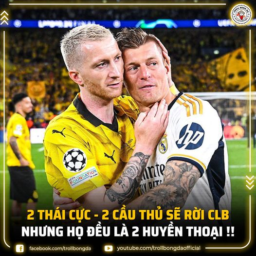

Bức ảnh có quá nhiều tình yêu ❤

 tensor(97)


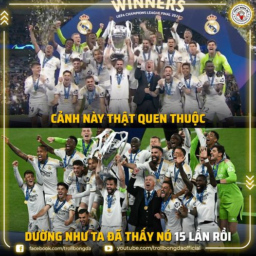

Chiếc cúp trao tay nhà vua!

 tensor(98)


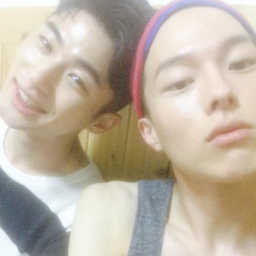

Ảnh quá khứ của 2 nam chính đang rất hot hiện tại - Byeon Woo Seok và Jang Ki Yong.

 tensor(99)


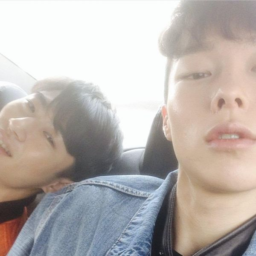

Ảnh quá khứ của 2 nam chính đang rất hot hiện tại - Byeon Woo Seok và Jang Ki Yong.

 tensor(100)


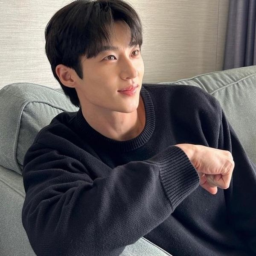

Ảnh quá khứ của 2 nam chính đang rất hot hiện tại - Byeon Woo Seok và Jang Ki Yong.

 tensor(101)


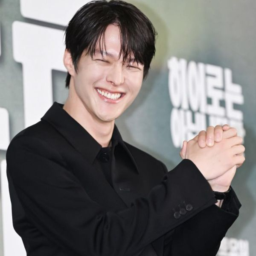

Ảnh quá khứ của 2 nam chính đang rất hot hiện tại - Byeon Woo Seok và Jang Ki Yong.

 tensor(102)


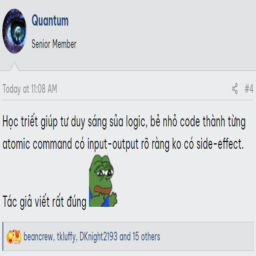

#VOZ_F33 - 'Nếu muốn thành kỹ sư, con phải học thêm triết'
https://voz.vn/.../neu-muon-thanh-ky-su-con-phai-hoc.../

 tensor(103)


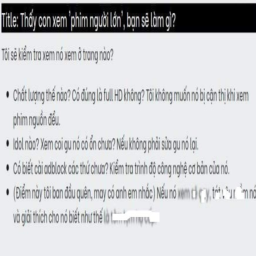

#VOZ_F33 - Xử trí thế nào khi bắt gặp con lén đọc truyện, xem phim 17+1?
https://voz.vn/.../xu-tri-the-nao-khi-bat-gap-con-len.../

 tensor(104)


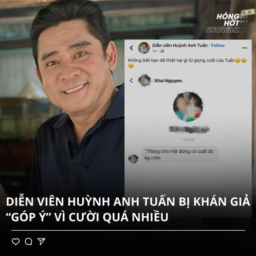

“Dạ thôi để mình khóc cho vừa lòng bạn🤣”

 tensor(105)


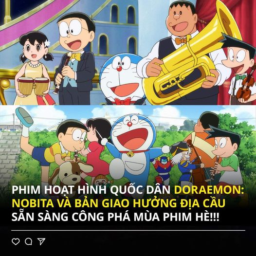

🔥 Hoạt hình quốc dân "PHIM ĐIỆN ẢNH DORAEMON: NOBITA VÀ BẢN GIAO HƯỞNG ĐỊA CẦU" sẵn sàng công phá mùa phim hè!!!
Tháng 5 này, hãy cùng theo chân biệt đội Doraemon, Nobita, Jaian (Chai-en), Suneo (Xê-kô) và Shizuka (Xu-ka) trên hành trình giải cứu thế giới trước âm mưu xóa sổ âm nhạc của những kẻ xấu. Với sự kết hợp hoàn hảo của những thước phim sinh động cùng âm nhạc ấn tượng, chắc chắn sẽ đưa bạn qua nhiều cung bậc cảm xúc khác nhau! Các "bé" U30, U40 cùng con coi phim thì nhớ chuẩn bị khăn giấy để ôn lại ký ức tuổi thơ nhé.
Đặc biệt, năm nay Việt Nam còn là quốc gia đầu tiên trên Thế giới (không tính Nhật Bản) được xem PHIM ĐIỆN ẢNH DORAEMON: NOBITA VÀ BẢN GIAO HƯỞNG ĐỊA CẦU đó. Phim sẽ có suất chiếu sớm nguyên ngày 18 &amp; 19/5 và chính thức khởi chiếu từ ngày 24/5. Hẹn mọi người tại rạp nhé!
#PhimDoraemon2024VN

 tensor(106)


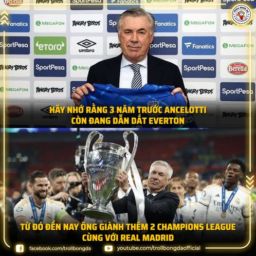

Đi trải nghiệm thôi :)))

 tensor(107)


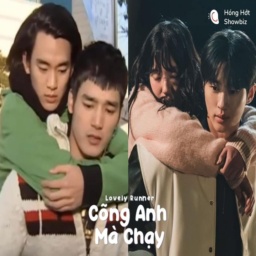

Bản gốc của “Cõng anh mà chạy”:

 tensor(108)


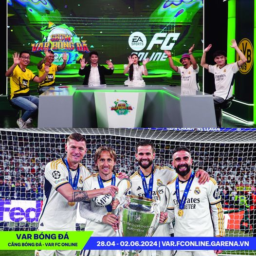

Mùa C1 khép lại với người xứng đáng nhất gọi tên Real Madrid cũng là lúc khép lại mùa 1 đầy thành công của VAR Bóng Đá Show. Chính xác về mặt dự đoán đến phút cuối cùng. Cùng đón chờ mùa 2 sẽ bùng nổ hơn nhé.
Đừng trắng tay như Reus mà vào nhận quà miễn phí dưới cmt nhé👇
#VarBongDa #FCOnline #DiChauAuXemEuro

 tensor(109)


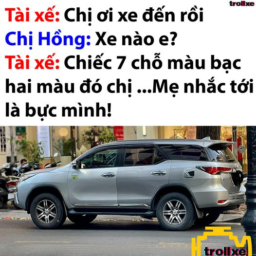

Nhắc tới cọc ngang

 tensor(110)


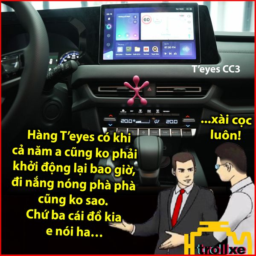

Khứa Sêu nhảy từ showroom xe bước qua hướng dẫn cách chốt màn hình android Teyes nhanh gọn lẹ, không nhiều lời, không lòng vòng!!! Một cho tất cả – Nâng tầm xe sang – Dập tắt mọi chuồng gà …CHÍNH LÀ NÓ!!! 
Hãy like và share cho Khứa Sêu vì cái gì thì con giời biết rồi đó!

 tensor(111)


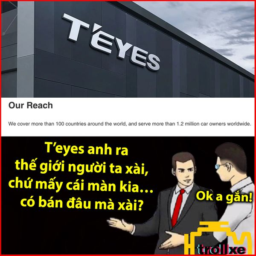

Khứa Sêu nhảy từ showroom xe bước qua hướng dẫn cách chốt màn hình android Teyes nhanh gọn lẹ, không nhiều lời, không lòng vòng!!! Một cho tất cả – Nâng tầm xe sang – Dập tắt mọi chuồng gà …CHÍNH LÀ NÓ!!! 
Hãy like và share cho Khứa Sêu vì cái gì thì con giời biết rồi đó!

 tensor(112)


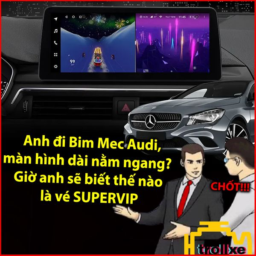

Khứa Sêu nhảy từ showroom xe bước qua hướng dẫn cách chốt màn hình android Teyes nhanh gọn lẹ, không nhiều lời, không lòng vòng!!! Một cho tất cả – Nâng tầm xe sang – Dập tắt mọi chuồng gà …CHÍNH LÀ NÓ!!! 
Hãy like và share cho Khứa Sêu vì cái gì thì con giời biết rồi đó!

 tensor(113)


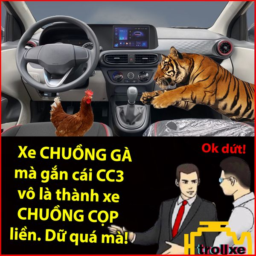

Khứa Sêu nhảy từ showroom xe bước qua hướng dẫn cách chốt màn hình android Teyes nhanh gọn lẹ, không nhiều lời, không lòng vòng!!! Một cho tất cả – Nâng tầm xe sang – Dập tắt mọi chuồng gà …CHÍNH LÀ NÓ!!! 
Hãy like và share cho Khứa Sêu vì cái gì thì con giời biết rồi đó!

 tensor(114)


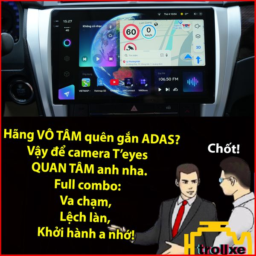

Khứa Sêu nhảy từ showroom xe bước qua hướng dẫn cách chốt màn hình android Teyes nhanh gọn lẹ, không nhiều lời, không lòng vòng!!! Một cho tất cả – Nâng tầm xe sang – Dập tắt mọi chuồng gà …CHÍNH LÀ NÓ!!! 
Hãy like và share cho Khứa Sêu vì cái gì thì con giời biết rồi đó!

 tensor(115)


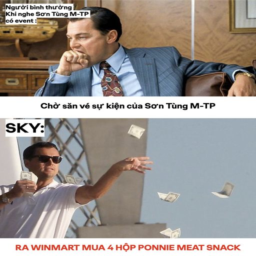

Đẳng cấp SKY “bơm” tấn!!
Vào Winmart mà thấy ai mua trên 3 hộp Ponnie Meat Snack thì đích thị là SKY “bơm tấn". SKY nào mà muốn nhập hội thì nhanh tay lẹ chân chạy ra Winmart mua liền đi nha.
SKY ơiiiii, tôi muốn thấy cánh tay của các bạn tại sự kiện “TRẠM BƠM CHẤT NON STOP" ngày 17-19/05 này nhé !!!!!!

 tensor(116)


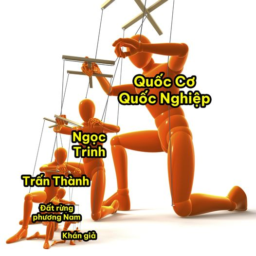

Những kẻ thao túng chúng ta
#interpool

 tensor(117)


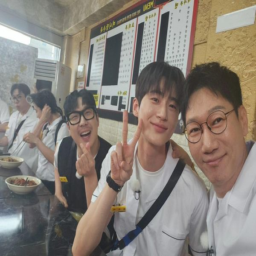

Byeon Woo-Seok cùng các thành viên Running Man 😍🫶🏻

 tensor(118)


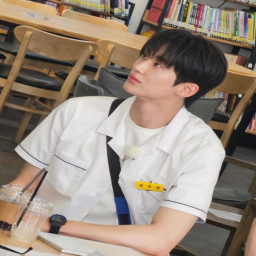

Byeon Woo-Seok cùng các thành viên Running Man 😍🫶🏻

 tensor(119)


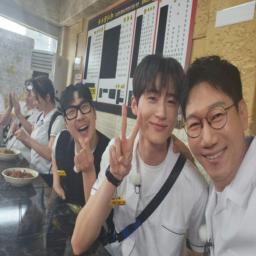

Byeon Woo-Seok cùng các thành viên Running Man 😍🫶🏻

 tensor(120)


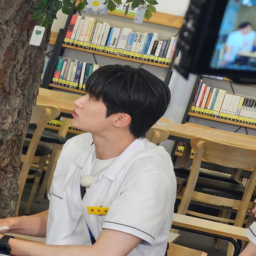

Byeon Woo-Seok cùng các thành viên Running Man 😍🫶🏻

 tensor(121)


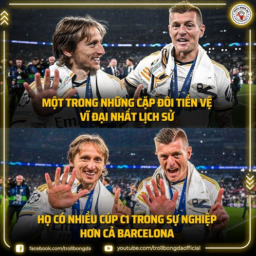

Hơn cả một CLB :))

 tensor(122)


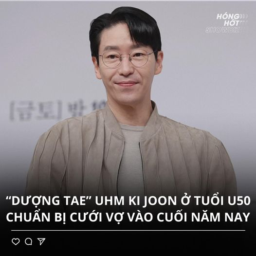

Công ty quản lý xác nhận “dượng Tae” Uhm Ki-joon (48 tuổi) sẽ kết hôn vào tháng 12. 
Vì cô dâu tương lai không phải là người nổi tiếng nên đám cưới sẽ được tổ chức riêng tư với sự tham dự của cả gia đình, họ hàng và những người quen biết thân thiết. 
Uhm Ki-joon gây ấn tượng qua nhiều vai diễn, đặc biệt là vai Joo Dan-tae trong loạt phim 'Penthouse'. Hiện tại, anh đang gặp lại khán giả một lần nữa với vai phản diện Matthew Lee trong 'Resurrection of the Seven'.

 tensor(123)


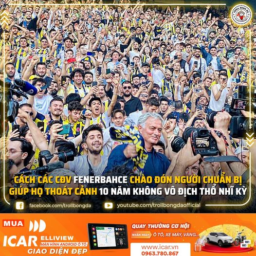

Mourinho chính thức trở thành HLV Fenerbahce.
Thành tích của CLB mùa trước là giành 99 điểm mà vẫn về nhì.

 tensor(124)


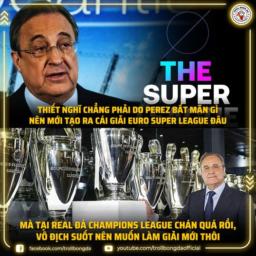

Sự thật :)))

 tensor(125)


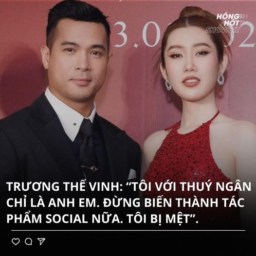

Trương Thế Vinh và Thuý Ngân từng bị cộng đồng mạng soi loạt hint hẹn hò. Mới đây, anh đã lên tiếng đính chính về tin đồn hẹn hò với Thuý Ngân:
 "Anh với Thuý Ngân là anh em. Tụi anh vẫn chơi với nhau một cách bình thường như là anh em. 7 nụ, mọi người như nhau. Tụi anh vui lắm". 
Bên cạnh đó, Trương Thế Vinh cũng tiết lộ bản thân cảm thấy mệt mỏi vì bị cộng đồng mạng đẩy thuyền quá mức: "Tụi anh đã cống hiến hết mình trên sân khấu, đó là công việc nhưng mà tụi anh ai cũng mong muốn có sự lựa chọn riêng của mình hết. Vậy đừng biến thành một tác phẩm trên social nữa. Anh bị mệt".
(Theo 28Unique)

 tensor(126)


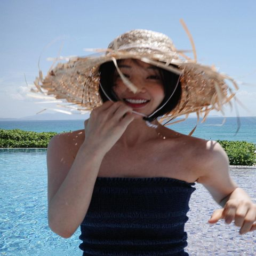

Nam Gyu Ri khoe ảnh du lịch nghỉ dưỡng tại Nha Trang 🇻🇳

 tensor(127)


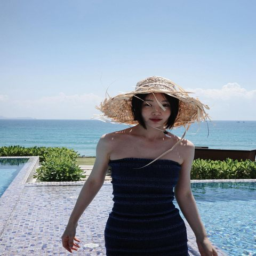

Nam Gyu Ri khoe ảnh du lịch nghỉ dưỡng tại Nha Trang 🇻🇳


In [ ]:
test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False)

for batch in test_loader:

    indices = batch['idx']
    images = batch['image']
    captions = batch['caption']

    for i in range(len(images)):
        print('\n', indices[i])
        display(transforms.ToPILImage()(images[i]))
        print(captions[i])

    break

In [ ]:
inverse_mapping = {v: k for k, v in mapping.items()}
inverse_mapping

{0: 'not-sarcasm', 1: 'multi-sarcasm', 2: 'image-sarcasm', 3: 'text-sarcasm'}

Infer using all models

In [ ]:
result = {}

with torch.no_grad():

    for batch in test_loader:

        indices = batch['idx']
        images = batch['image']
        captions = batch['caption']

        logits = [model(images, captions) for model in models]
        logits = torch.stack(logits)  # (num_models, batch_size, num_classes)

        ensemble_logits = logits.mean(dim=0)   # Average logits
        preds = ensemble_logits.argmax(dim=1)  # Final predictions

        for i, idx in enumerate(indices):
            label = inverse_mapping.get(preds[i].item())
            result[idx.item()] = label

out_data = {
    "results": result,
    "phase": "test"
}

In [ ]:
from collections import Counter

count = Counter((list(out_data['results'].values())))

print(count)

Counter({'multi-sarcasm': 1012, 'not-sarcasm': 435, 'image-sarcasm': 57})


In [ ]:
os.chdir(r'/kaggle/working')

output_file = 'results_1.json'

with open(output_file, 'w') as f:
    json.dump(out_data, f, indent=4)

os.listdir()

['model_3_best.pth',
 '.virtual_documents',
 'results_1.json',
 'model_7_best.pth',
 'model_12_best.pth']

Infer using the selected models

In [ ]:
selected_model_indices

[0, 1, 2, 3, 4, 5, 6, 8, 10, 11]

In [ ]:
result = {}

with torch.no_grad():

    for batch in test_loader:

        indices = batch['idx']
        images = batch['image']
        captions = batch['caption']

        logits = [models[i](images, captions) for i in selected_model_indices]
        logits = torch.stack(logits)  # (num_models, batch_size, num_classes)

        ensemble_logits = logits.mean(dim=0)   # Average logits
        preds = ensemble_logits.argmax(dim=1)  # Final predictions

        for i, idx in enumerate(indices):
            label = inverse_mapping.get(preds[i].item())
            result[idx.item()] = label

out_data = {
    "results": result,
    "phase": "test"
}

In [ ]:
from collections import Counter

count = Counter((list(out_data['results'].values())))

print(count)

Counter({'multi-sarcasm': 1024, 'not-sarcasm': 427, 'image-sarcasm': 53})


In [ ]:
os.chdir(r'/kaggle/working')

output_file = 'results_2.json'

with open(output_file, 'w') as f:
    json.dump(out_data, f, indent=4)

os.listdir()

['model_3_best.pth',
 'results_2.json',
 '.virtual_documents',
 'results_1.json',
 'model_7_best.pth',
 'model_12_best.pth']

Running the entire notebook takes 10 hours